In [1]:
import numpy as np
import csv
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
#from tensorflow.examples.tutorials.mnist import input_data
from torch.autograd import Variable
import sklearn.metrics as metrics
import pickle
import os
import numpy.linalg as la
import random
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
from matplotlib import pyplot as plt
import matplotlib.cm as cm
from sklearn.manifold import TSNE

In [2]:
transform = transforms.Compose(
    [transforms.ToTensor()])#,transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))])
train_set = dset.MNIST('/home/daiict/Desktop/udit/C-GAN./data' ,train=True, download= True,
                       transform = transform)
test_set = dset.MNIST('/home/daiict/Desktop/udit/C-GAN./data' ,train=False, download=True,
                       transform = transform)

In [3]:
batch_size = 100

train_loader = torch.utils.data.DataLoader(train_set, batch_size=batch_size,shuffle=True)
test_loader = torch.utils.data.DataLoader(test_set, batch_size=1000,shuffle=True)

print len(train_loader), len(test_loader)

ip_dim = 28*28
z_dim = 2
comb_dim = ip_dim + z_dim

600 10


### Check tsne

In [4]:
# xtmp,label_tmp = next(iter(test_loader))
# xtmp = xtmp.numpy()
# xtmp = xtmp.reshape(1000,28*28)
# X_embedded = TSNE(n_components=2).fit_transform(xtmp)
# plt.figure(figsize=(8, 6)) 
# plt.scatter(X_embedded[:, 0], X_embedded[:, 1],c = labels2,cmap=plt.cm.hot)
# plt.colorbar()
# plt.grid()
# plt.show()  

In [5]:
#### Encoder

class encoder(nn.Module):
    def __init__(self):
        super(encoder,self).__init__()
        self.l1 = nn.Linear(ip_dim,500)
        self.l2 = nn.Linear(500,500)
        self.l3 = nn.Linear(500,300)
        self.l4 = nn.Linear(300,300)
        self.l5 = nn.Linear(300,z_dim)
        
    def forward(self,x):
        x = F.leaky_relu(self.l1(x))
        x = F.leaky_relu(self.l2(x))
        x = F.leaky_relu(self.l3(x))
        x = F.leaky_relu(self.l4(x))
        x = (self.l5(x))
        
        return x

### Decoder

class decoder(nn.Module):
    def __init__(self):
        super(decoder,self).__init__()
        self.l1 = nn.Linear(z_dim+10,300)
        self.l2 = nn.Linear(300,300)
        self.l3 = nn.Linear(300,500)
        self.l4 = nn.Linear(500,500)
        self.l5 = nn.Linear(500,ip_dim)
        
    def forward(self,x):
        x = F.leaky_relu(self.l1(x))
        x = F.leaky_relu(self.l2(x))
        x = F.leaky_relu(self.l3(x))
        x = F.leaky_relu(self.l4(x))
        x = F.sigmoid(self.l5(x))
        
        return x

###  Discriminator

class disc(nn.Module):
    def __init__(self):
        super(disc,self).__init__()
        self.l1 = nn.Linear(z_dim+10,100)
        self.l2 = nn.Linear(100,100)
        self.l3 = nn.Linear(100,100)
        self.l4 = nn.Linear(100,1)
        
    def forward(self,x):
        x = F.leaky_relu(self.l1(x))
        x = F.leaky_relu(self.l2(x))
        x = F.leaky_relu(self.l3(x))
        x = F.sigmoid(self.l4(x))
        
        return x
    
class disc2(nn.Module):
    def __init__(self):
        super(disc2,self).__init__()
        self.l1 = nn.Linear(ip_dim,500)
        self.l2 = nn.Linear(500,500)
        self.l3 = nn.Linear(500,100)
        self.l4 = nn.Linear(100,1)
        
    def forward(self,x):
        x = F.leaky_relu(self.l1(x))
        x = F.leaky_relu(self.l2(x))
        x = F.leaky_relu(self.l3(x))
        x = F.sigmoid(self.l4(x))
        
        return x

In [6]:
def add_label_info(y,batch_size,numpy=False):

    tmp = np.zeros((batch_size,10))
    if(numpy == False):
        y = y.cpu().numpy().reshape(batch_size,1)
    for i in range(y.shape[0]):
        tmp[i,y[i]] = 1
    label_info = torch.from_numpy((tmp))
    return label_info

In [7]:
def get_true_z(label):
    
    noise = np.random.randn(batch_size,z_dim)
    label = label.numpy().reshape(batch_size,1)
    #print noise.shape,label.shape
    z = 0.5*noise + label*10
    z = Variable(torch.FloatTensor(z).cuda())
    return z
    #z = torch.add(noise,value=1,other=label)
    #z = Variable(z.cuda())

In [8]:
def train_model(Q,Q_solver,P,P_solver,D,D_solver,D2,D2_solver,batch_size):
    recon = []
    encode = []
    discriminate = []
    for it in range(2,5000):
        x,y = next(iter(train_loader))
       
        x = x.view(batch_size,28*28)
        if(cuda==True):
            x = Variable(x.cuda())
            label_info = Variable((add_label_info(y,batch_size)).type(torch.FloatTensor)).cuda()

        else:
            x = Variable(x)
            label_info = Variable((add_label_info(y,batch_size)).type(torch.FloatTensor))

        z = Q(x)

        #Reconstruction

        z_false = (torch.cat([z,label_info],1))
        
        x_recon = P(z_false)
        
        add_small = 1e-20
        
#         if(it%1==0):
#             CEL = F.binary_cross_entropy(x_recon,x)
#             #CEL = criterion(x_recon, x)
        
#             CEL.backward(retain_graph=True)
#             Q_solver.step()
#             P_solver.step()
        
#             Q.zero_grad()
#             P.zero_grad()
#         recon.append(CEL)

## use a discriminator to learn the reconstruction loss also discriminatively
        if(it%1==0):
#             if(it%2==0):
#                 Dx_false = D2(x_recon)
#                 Dx_true = D2(x)

#                 D2_loss = -torch.mean(torch.log(Dx_true + add_small) + torch.log(1 - Dx_false + add_small))
#                 D2_loss.backward(retain_graph=True)
#                 D2_solver.step()
#                 D2.zero_grad()

            Dx_false = D2(x_recon)
            
            #recon_loss = -torch.mean(torch.log(Dx_false))
            recon_loss = F.binary_cross_entropy(x_recon,x)
            recon_loss.backward(retain_graph=True)
            Q_solver.step()
            P_solver.step()
            Q.zero_grad()
            P.zero_grad()
            
        

        
        
        
        
        
        #Discriminator
       
#         z_true = Variable(torch.randn(batch_size,z_dim).cuda(),requires_grad = False)
#         if cuda==True:
#             z_true = Variable(torch.cat([z_true,label_info],1).data,requires_grad = False).cuda()
#         else:
#             z_true = Variable(torch.cat([z_true,label_info],1).data,requires_grad = False)

#         z_true_op = D(z_true)
        
#         z_false_op = D(z_false)
        
        
#         if(it%1==0):
    
#             loss_d = -torch.mean(torch.log(z_true_op + add_small) + torch.log(1 - z_false_op + add_small))
#             loss_d.backward(retain_graph=True)
#             D_solver.step()
#             D.zero_grad()
#             discriminate.append(loss_d)

    #Updating the encoder
        
#         G_loss = -torch.mean(torch.log(z_false_op+1e-20))
#         G_loss.backward(retain_graph=True)
#         Q_solver.step()
#         Q_solver.zero_grad()
#         encode.append(G_loss)
        
        
    ## occasionally update the encoder with MSE loss
    
#         if(it%25==0):
#             tmp_loss = nn.MSELoss()(z_false,z_true)
#             print('tmp_loss:',tmp_loss.data[0])
#             tmp_loss = 1e-3*tmp_loss
#             tmp_loss.backward()
#             Q_solver.step()
#             Q_solver.zero_grad()

        
        
        if(it%25==0):
            #print(extra_loss.data[0],CEL.data[0])
            print('recon_loss:', recon_loss.data[0])#,'D2_loss',D2_loss.data[0])
            #print('gen_loss: ',G_loss.data[0],'disc_loss:', loss_d.data[0])
#             plt.plot(range(1,it),np.array(discriminate).reshape(len(discriminate),1))
#             plt.title('discriminator loss')
#             plot.show()
            
            
#             plt.plot(range(1,it),np.array(encode).reshape(len(encode),1))
#             plt.title('encoder loss')
#             plot.show()
           
#             plt.plot(range(1,it),np.array(reconstruct).reshape(len(reconstruct),1))
#             plt.title('reconstruction loss')
#             plot.show()            
        
        ## plot the distribution ##
        if(it%25 == 0):
            xcheck,labels = next(iter(test_loader))
            xcheck = xcheck.view(1000,28*28)
            xcheck = Variable(xcheck.cuda())
            labels_sc = labels.cpu().numpy()
            #xcheck = Variable(xcheck.view(1000,28*28).cuda())
            zhat = Q(xcheck)
            z_mu = zhat.cpu().data.numpy()
            plt.figure(figsize=(8, 6)) 
           
            plt.scatter(z_mu[:, 0], z_mu[:, 1],c = labels_sc)#,cmap=plt.cm.autumn)
            plt.colorbar()
            plt.grid()
            plt.show()   
            
            zcheck = Variable(torch.randn(1,z_dim).cuda())
            
            y = np.array([2])
            label_info = (add_label_info(y,1,numpy=True))
            z_false = np.concatenate((zcheck.cpu().data.numpy(),label_info.cpu().numpy()),1)
            z_false = Variable(torch.FloatTensor(z_false)).cuda()
            print z_false.size()
            x_recon = P(z_false)
            op = x_recon.cpu().data.numpy()
            op = op.reshape(28,28)
            plt.imshow(op)
            plt.show()
    return Q,P

In [9]:
def generate_model():
    
    if cuda==True:
        Q = encoder().cuda()
        P = decoder().cuda()
        D = disc().cuda()
        D2 = disc2().cuda()
    else:
        Q = encoder()
        P = decoder()
        D = disc()
   
    Q_solver = optim.Adam(Q.parameters(),lr=1e-3)
    E_solver = optim.Adam(Q.parameters(),lr = 1e-3)
    
    P_solver = optim.Adam(P.parameters(),lr = 1e-3)
   
    D_solver = optim.Adam(D.parameters(),lr = 1e-3)
    D2_solver = optim.Adam(D2.parameters(),lr = 1e-3)
    Q,P = train_model(Q,Q_solver,P,P_solver,D,D_solver,D2,D2_solver,batch_size)
    
 
    
    return Q,P

('recon_loss:', 0.2653070092201233)


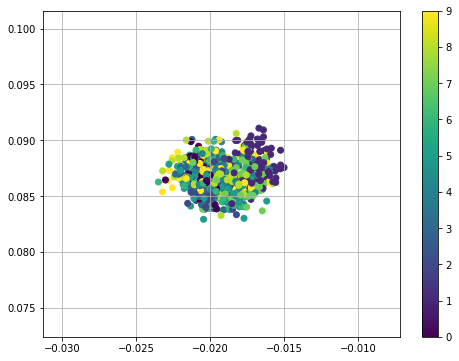

torch.Size([1, 12])


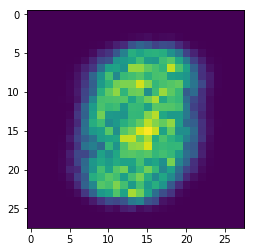

('recon_loss:', 0.24659690260887146)


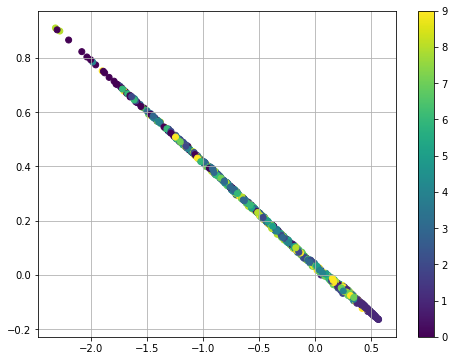

torch.Size([1, 12])


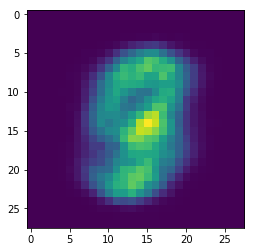

('recon_loss:', 0.24797672033309937)


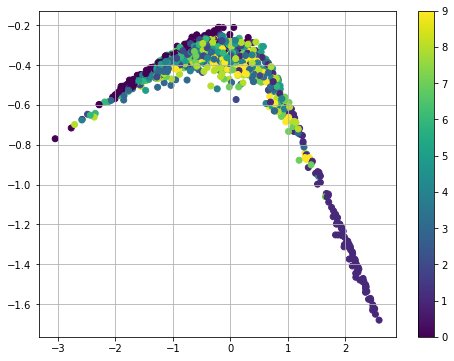

torch.Size([1, 12])


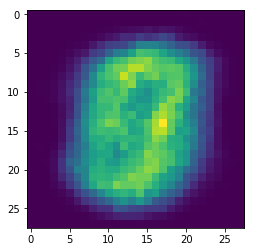

('recon_loss:', 0.2346937507390976)


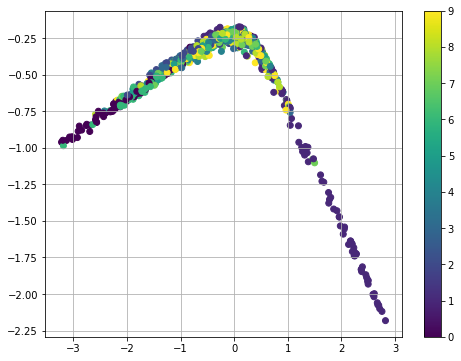

torch.Size([1, 12])


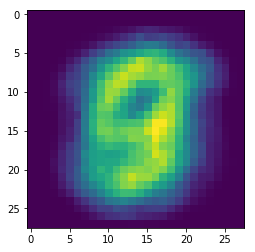

('recon_loss:', 0.23506225645542145)


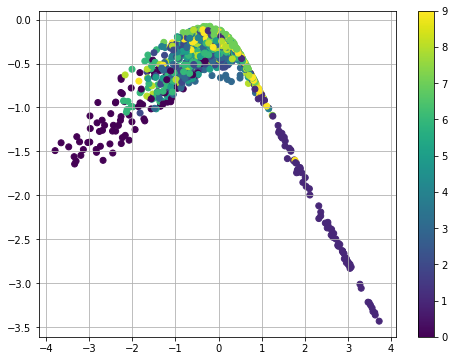

torch.Size([1, 12])


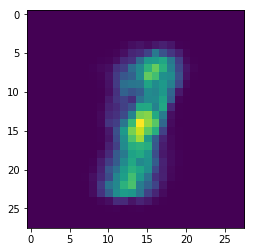

('recon_loss:', 0.213594451546669)


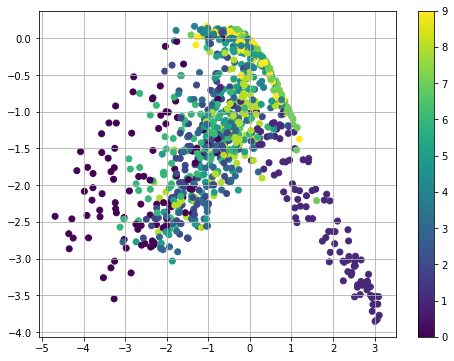

torch.Size([1, 12])


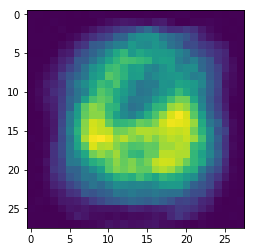

('recon_loss:', 0.1918341964483261)


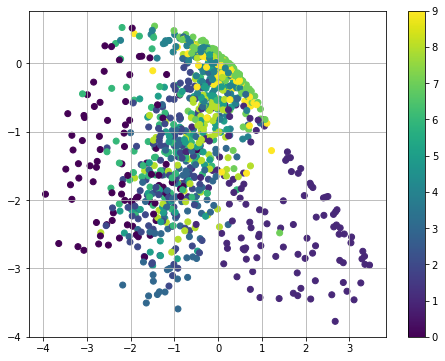

torch.Size([1, 12])


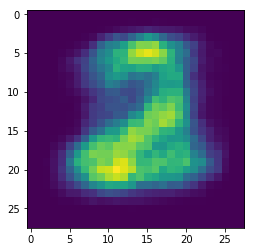

('recon_loss:', 0.20211689174175262)


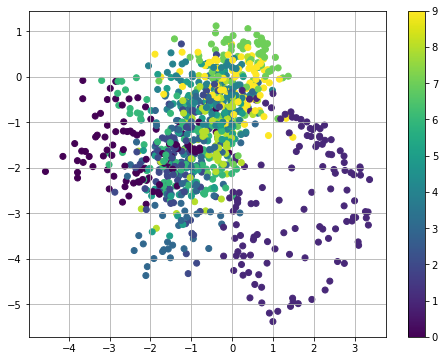

torch.Size([1, 12])


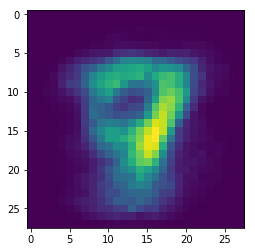

('recon_loss:', 0.20064428448677063)


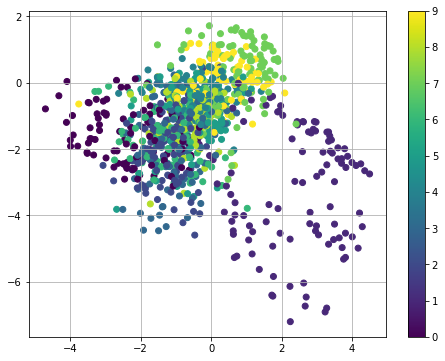

torch.Size([1, 12])


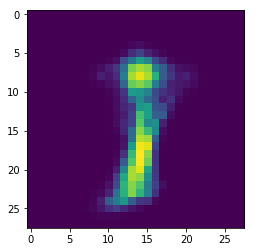

('recon_loss:', 0.1845756322145462)


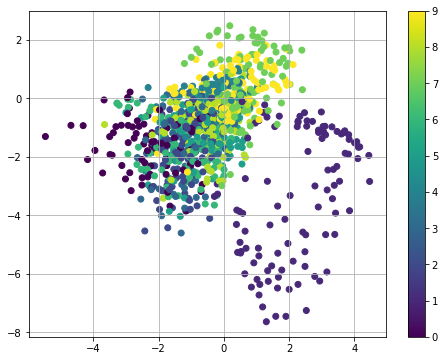

torch.Size([1, 12])


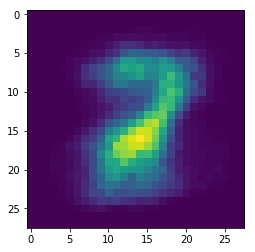

('recon_loss:', 0.18544422090053558)


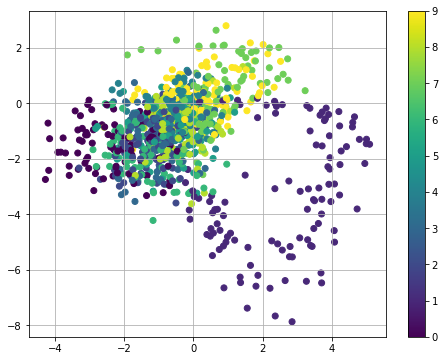

torch.Size([1, 12])


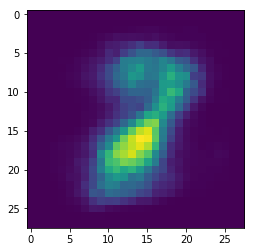

('recon_loss:', 0.19414757192134857)


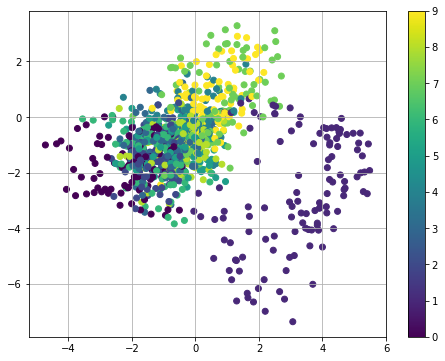

torch.Size([1, 12])


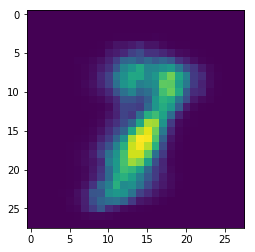

('recon_loss:', 0.18412508070468903)


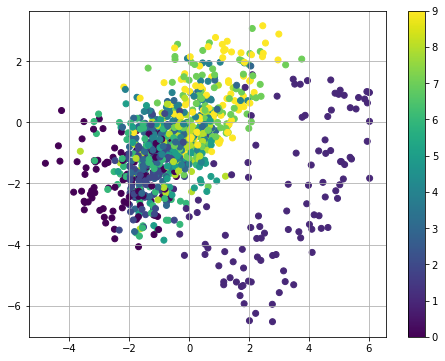

torch.Size([1, 12])


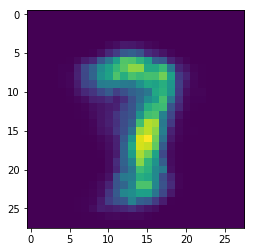

('recon_loss:', 0.17992287874221802)


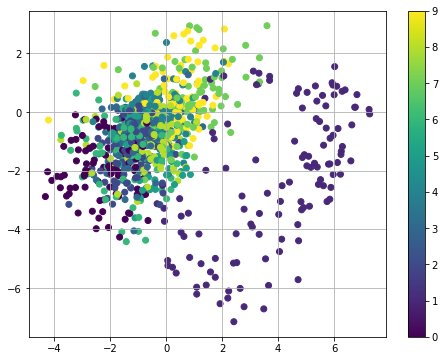

torch.Size([1, 12])


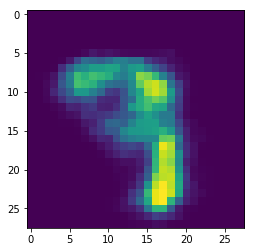

('recon_loss:', 0.17344652116298676)


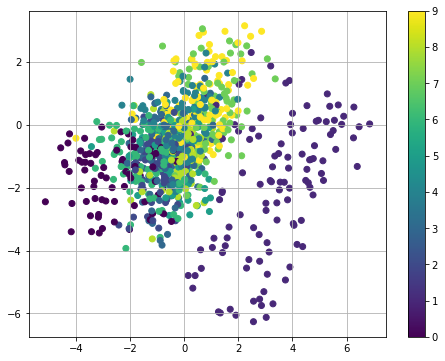

torch.Size([1, 12])


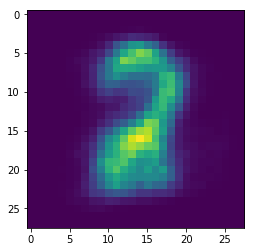

('recon_loss:', 0.17515307664871216)


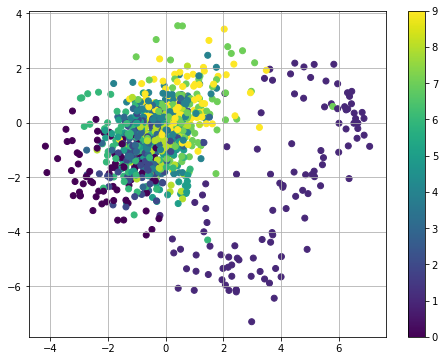

torch.Size([1, 12])


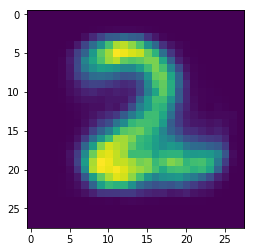

('recon_loss:', 0.18685168027877808)


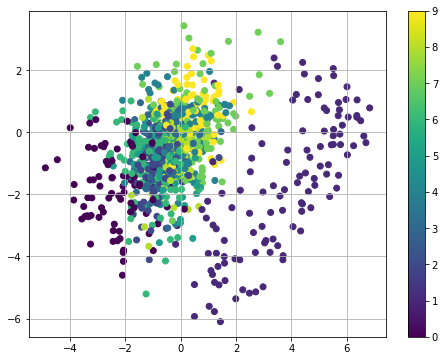

torch.Size([1, 12])


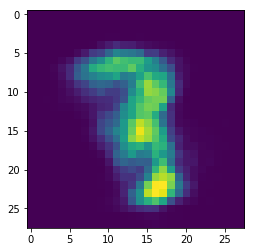

('recon_loss:', 0.17690031230449677)


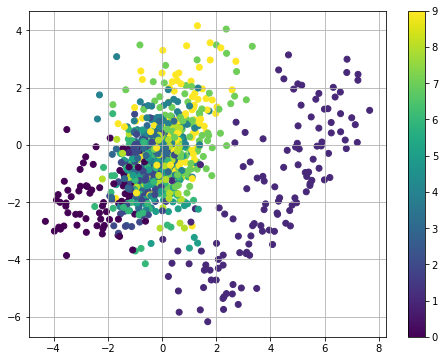

torch.Size([1, 12])


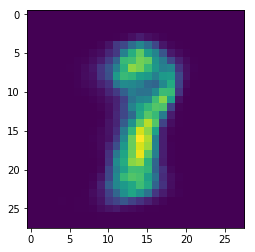

('recon_loss:', 0.1680360734462738)


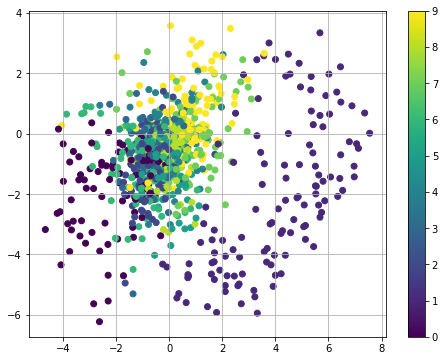

torch.Size([1, 12])


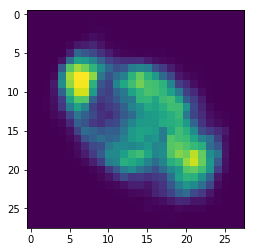

('recon_loss:', 0.16972267627716064)


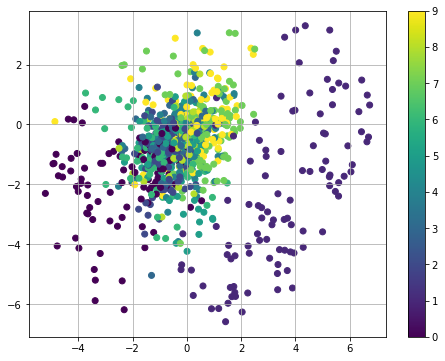

torch.Size([1, 12])


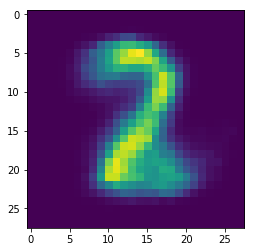

('recon_loss:', 0.1759040355682373)


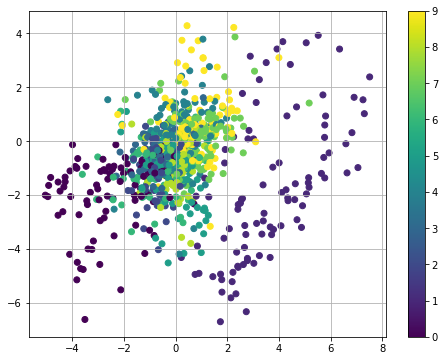

torch.Size([1, 12])


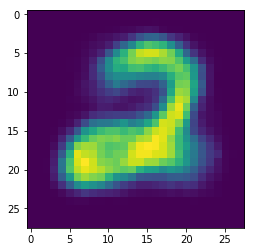

('recon_loss:', 0.1668805629014969)


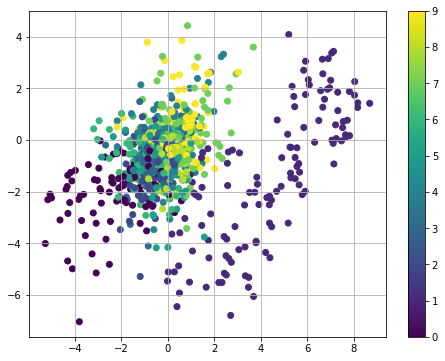

torch.Size([1, 12])


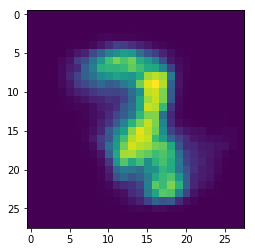

('recon_loss:', 0.15515710413455963)


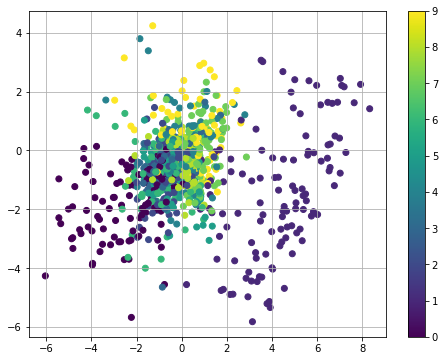

torch.Size([1, 12])


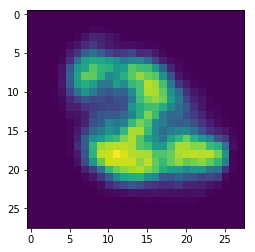

('recon_loss:', 0.17338202893733978)


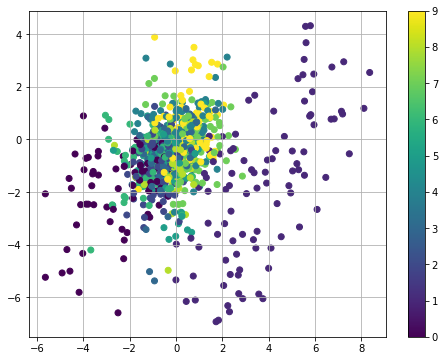

torch.Size([1, 12])


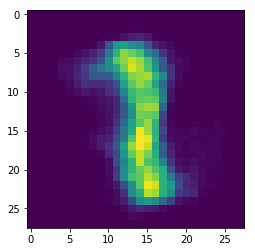

('recon_loss:', 0.17856796085834503)


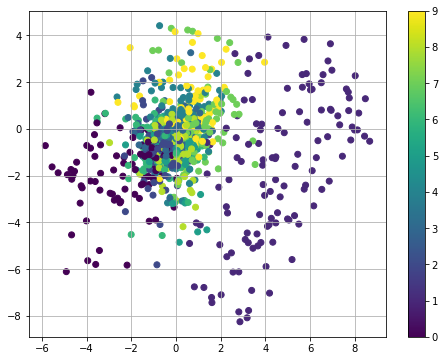

torch.Size([1, 12])


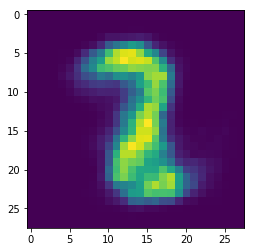

('recon_loss:', 0.1642332375049591)


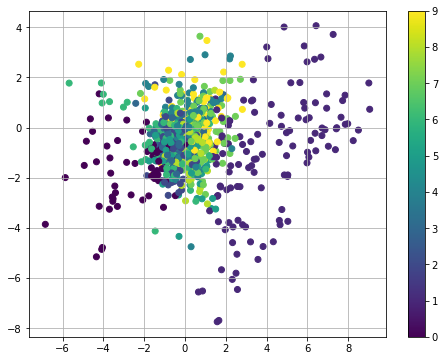

torch.Size([1, 12])


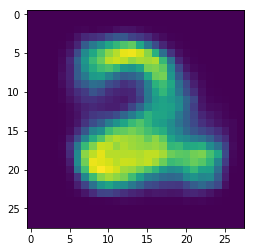

('recon_loss:', 0.1640355885028839)


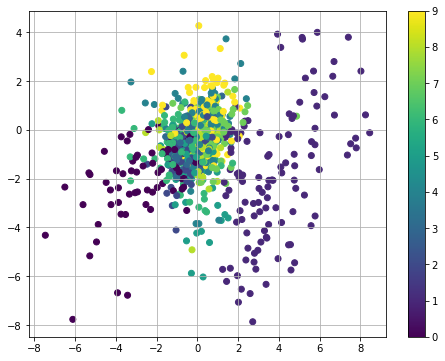

torch.Size([1, 12])


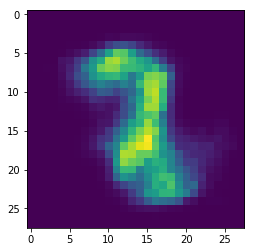

('recon_loss:', 0.1730688512325287)


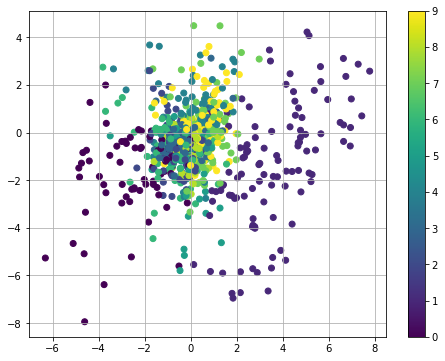

torch.Size([1, 12])


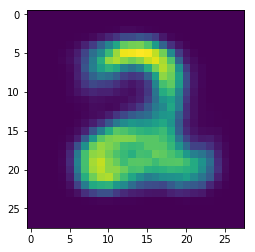

('recon_loss:', 0.16114510595798492)


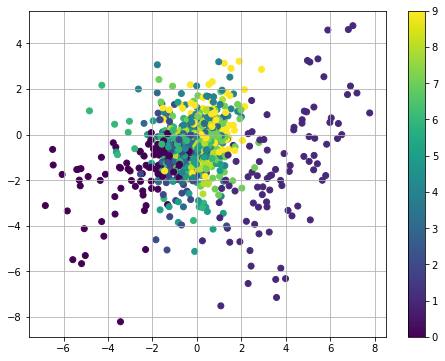

torch.Size([1, 12])


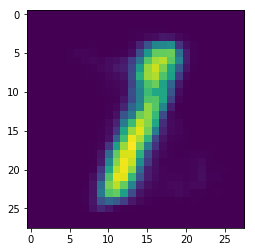

('recon_loss:', 0.17195966839790344)


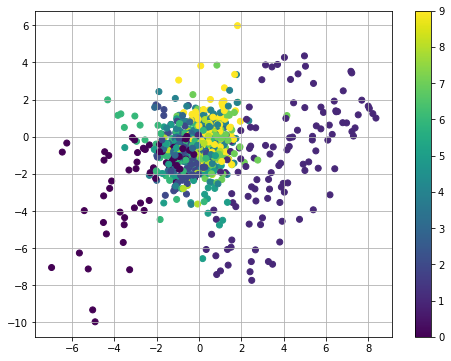

torch.Size([1, 12])


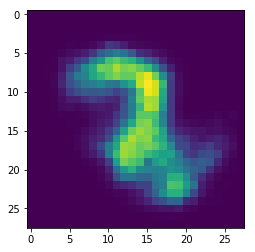

('recon_loss:', 0.17505617439746857)


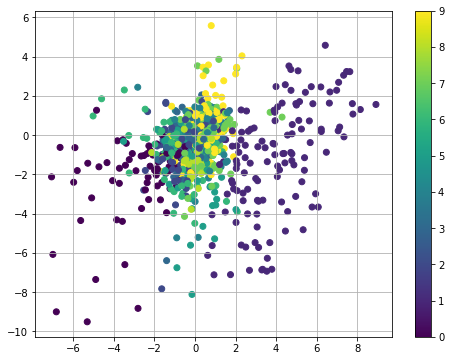

torch.Size([1, 12])


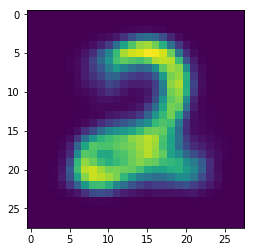

('recon_loss:', 0.17591242492198944)


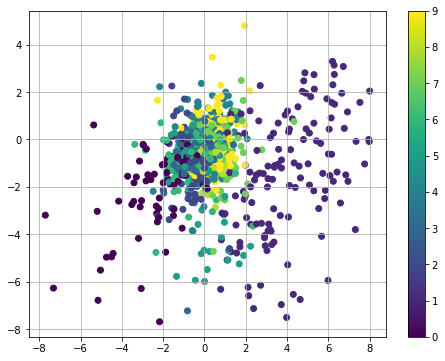

torch.Size([1, 12])


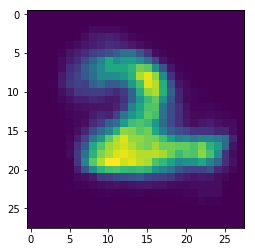

('recon_loss:', 0.1698375791311264)


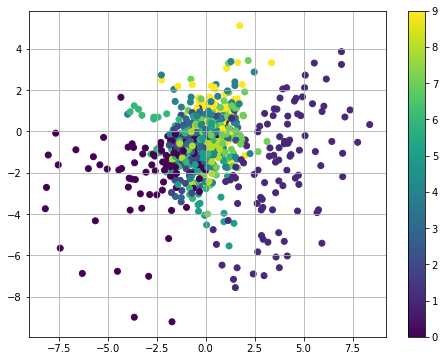

torch.Size([1, 12])


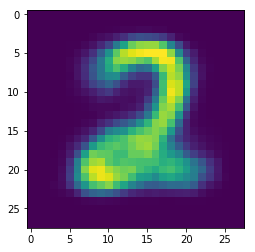

('recon_loss:', 0.15595364570617676)


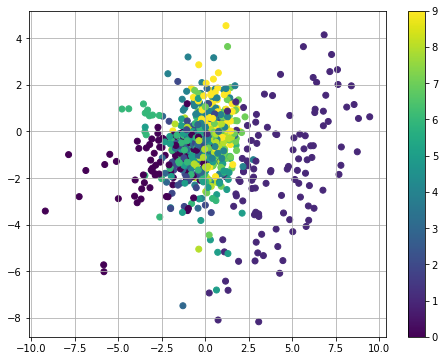

torch.Size([1, 12])


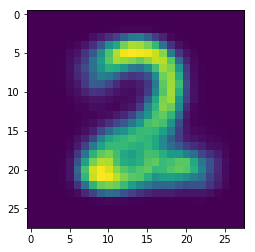

('recon_loss:', 0.15774790942668915)


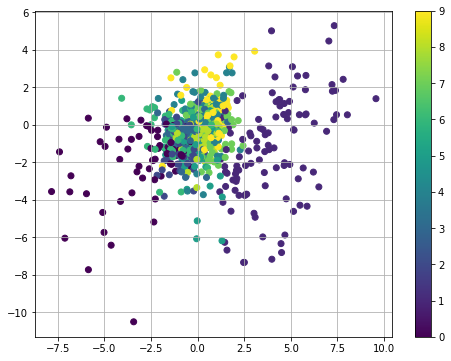

torch.Size([1, 12])


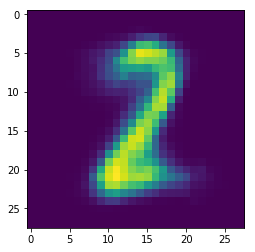

('recon_loss:', 0.16006506979465485)


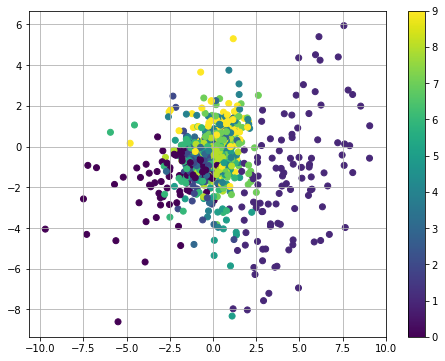

torch.Size([1, 12])


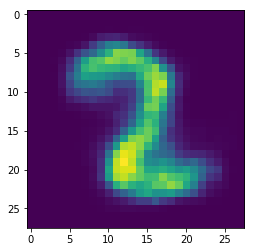

('recon_loss:', 0.17756882309913635)


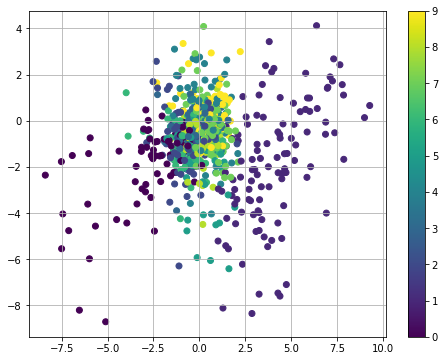

torch.Size([1, 12])


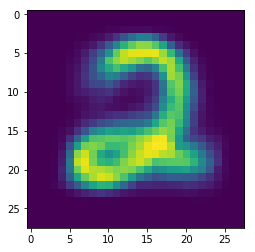

('recon_loss:', 0.1641286462545395)


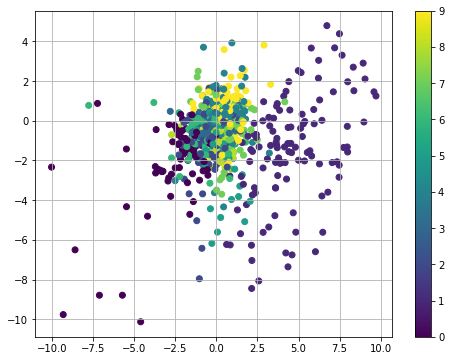

torch.Size([1, 12])


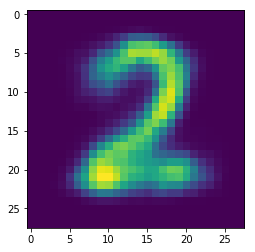

('recon_loss:', 0.16861288249492645)


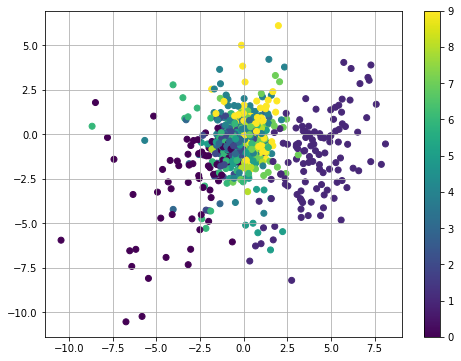

torch.Size([1, 12])


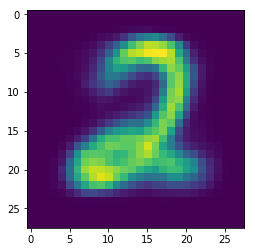

('recon_loss:', 0.1615007370710373)


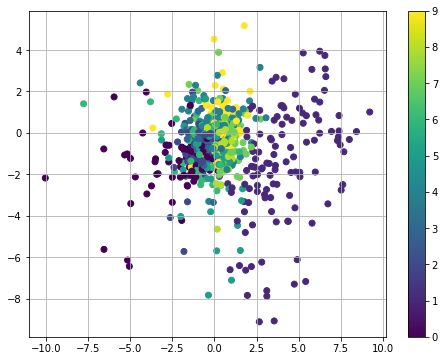

torch.Size([1, 12])


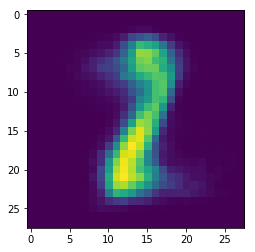

('recon_loss:', 0.1576547622680664)


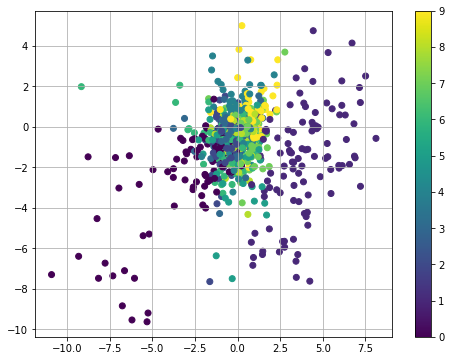

torch.Size([1, 12])


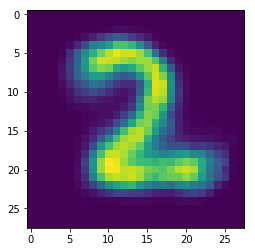

('recon_loss:', 0.16555285453796387)


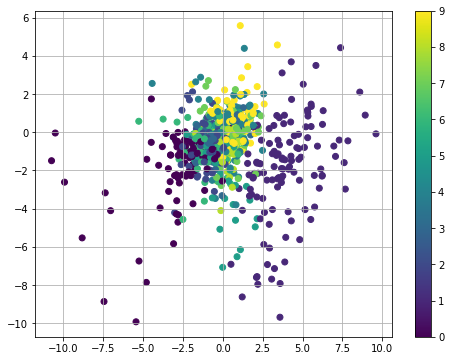

torch.Size([1, 12])


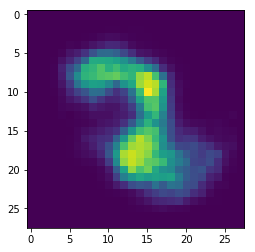

('recon_loss:', 0.16057558357715607)


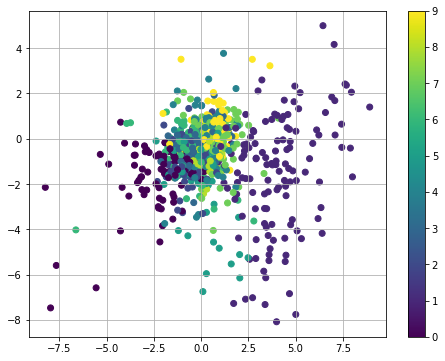

torch.Size([1, 12])


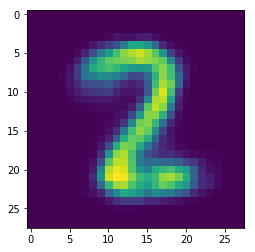

('recon_loss:', 0.1585186868906021)


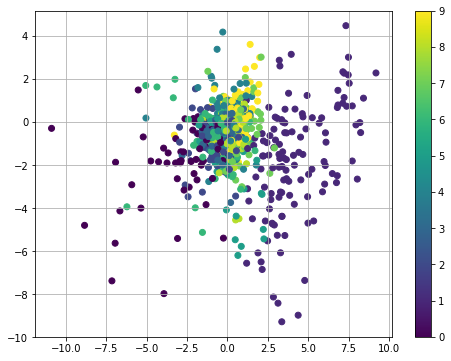

torch.Size([1, 12])


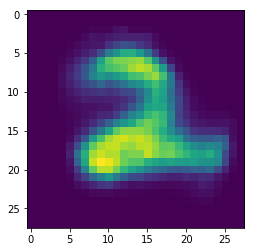

('recon_loss:', 0.16470830142498016)


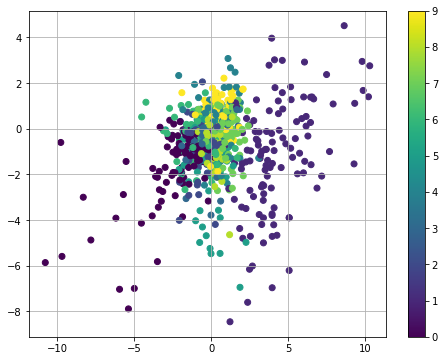

torch.Size([1, 12])


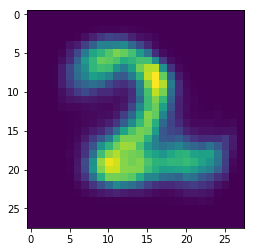

('recon_loss:', 0.16651660203933716)


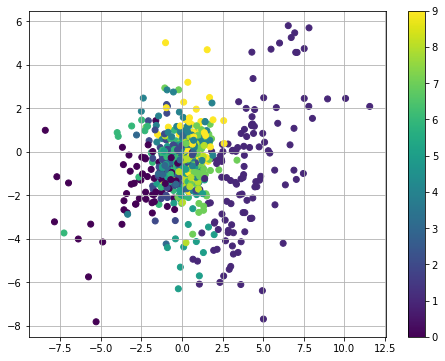

torch.Size([1, 12])


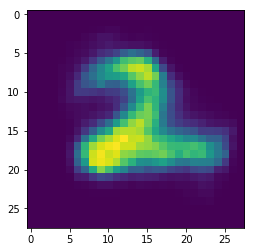

('recon_loss:', 0.1674811840057373)


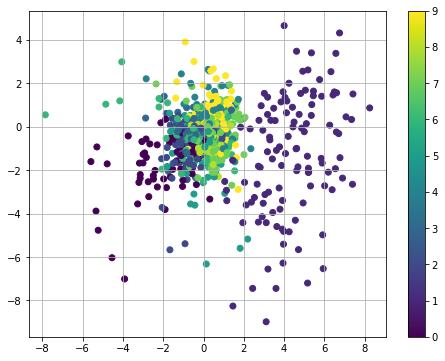

torch.Size([1, 12])


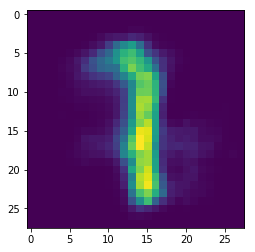

('recon_loss:', 0.15595291554927826)


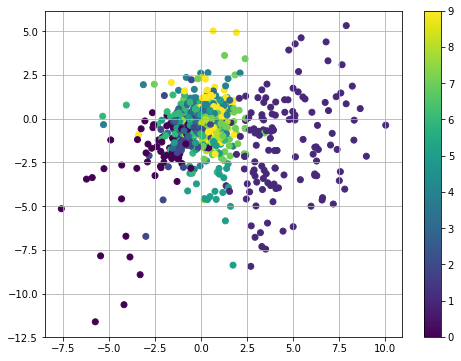

torch.Size([1, 12])


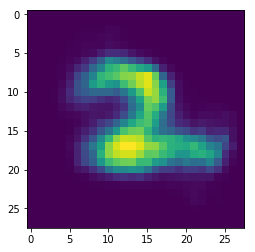

('recon_loss:', 0.16029372811317444)


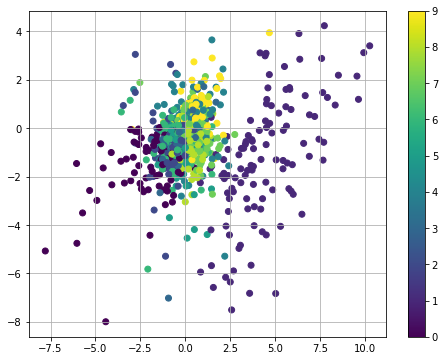

torch.Size([1, 12])


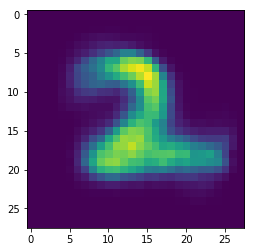

('recon_loss:', 0.15836450457572937)


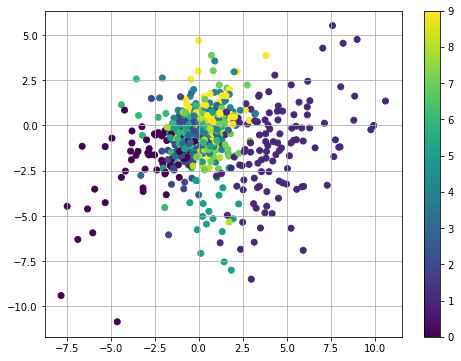

torch.Size([1, 12])


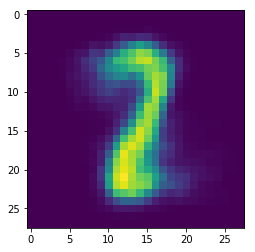

('recon_loss:', 0.1496126651763916)


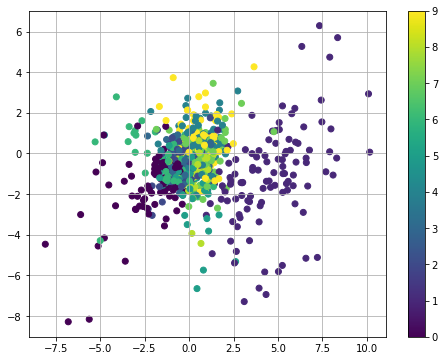

torch.Size([1, 12])


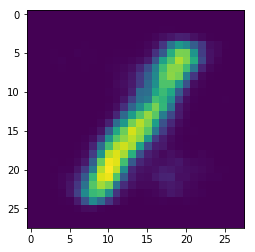

('recon_loss:', 0.1566450446844101)


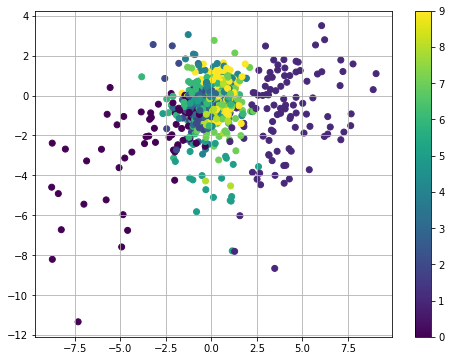

torch.Size([1, 12])


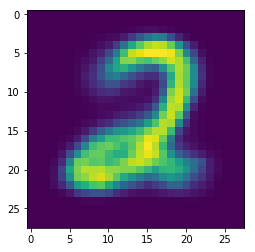

('recon_loss:', 0.1681627631187439)


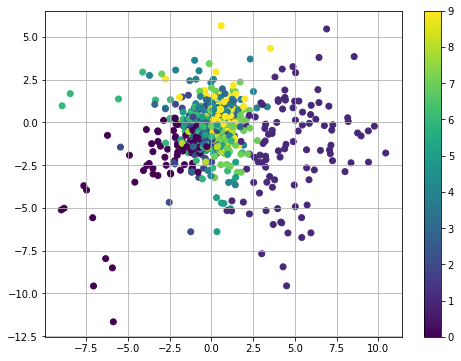

torch.Size([1, 12])


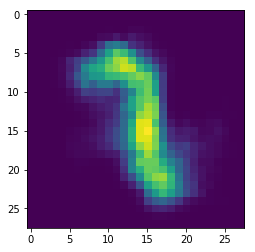

('recon_loss:', 0.16947050392627716)


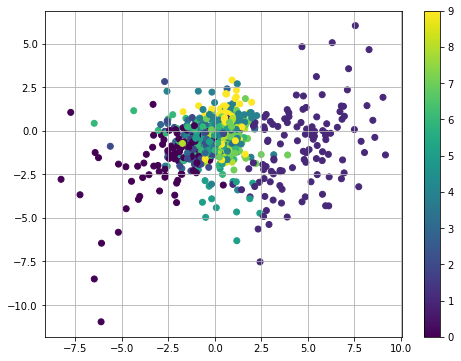

torch.Size([1, 12])


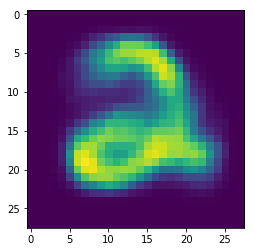

('recon_loss:', 0.17009781301021576)


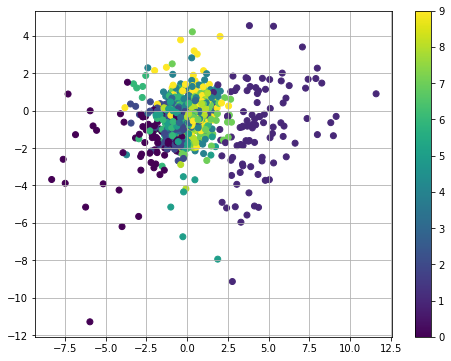

torch.Size([1, 12])


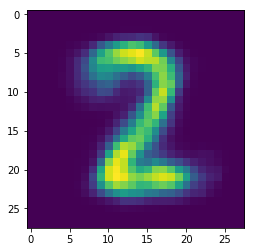

('recon_loss:', 0.16766144335269928)


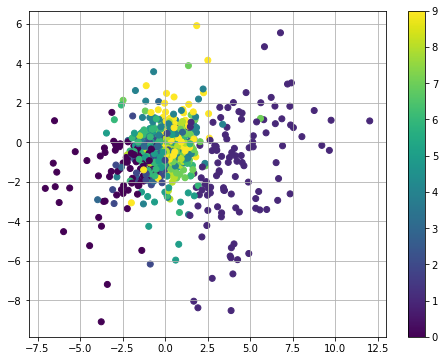

torch.Size([1, 12])


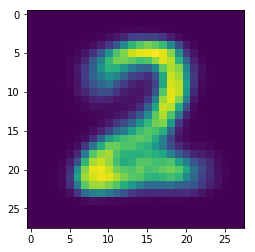

('recon_loss:', 0.1637839674949646)


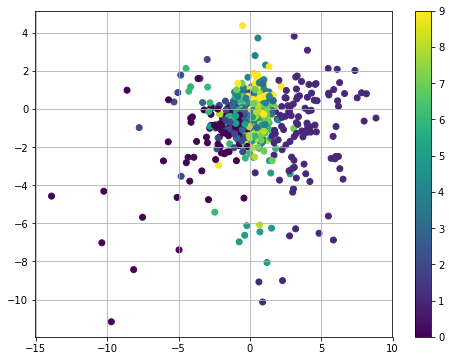

torch.Size([1, 12])


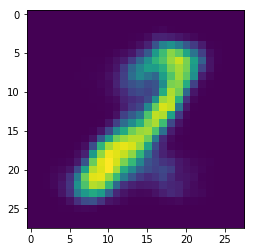

('recon_loss:', 0.16091328859329224)


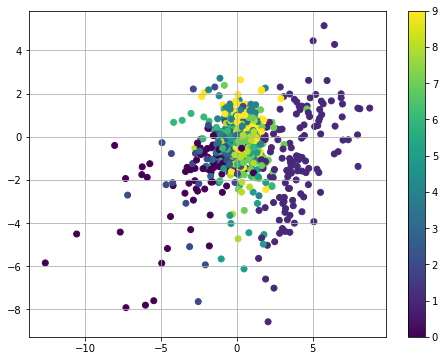

torch.Size([1, 12])


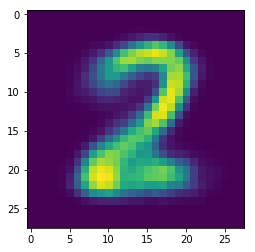

('recon_loss:', 0.1620371788740158)


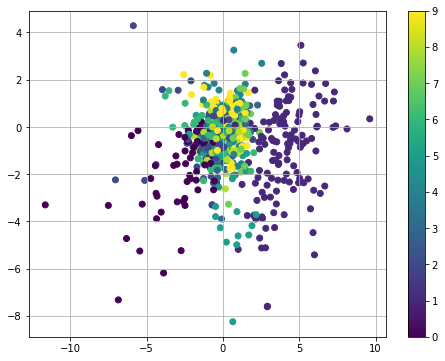

torch.Size([1, 12])


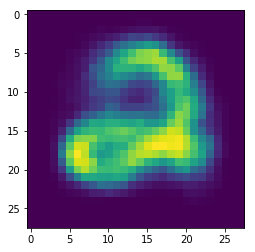

('recon_loss:', 0.15410347282886505)


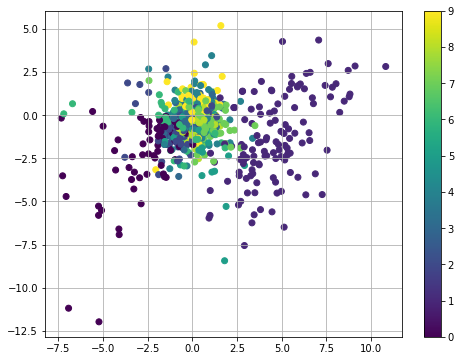

torch.Size([1, 12])


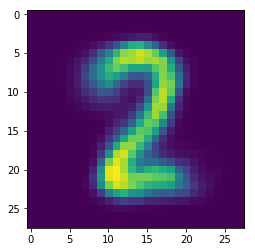

('recon_loss:', 0.1545993685722351)


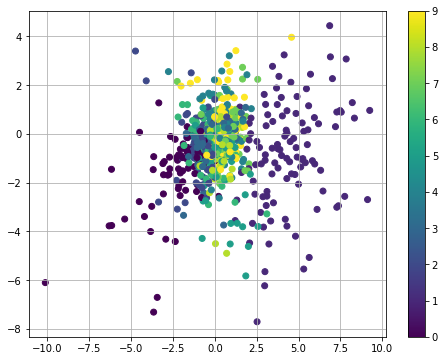

torch.Size([1, 12])


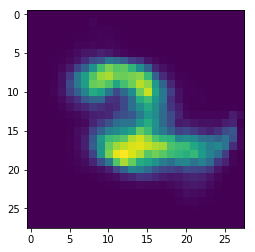

('recon_loss:', 0.17141398787498474)


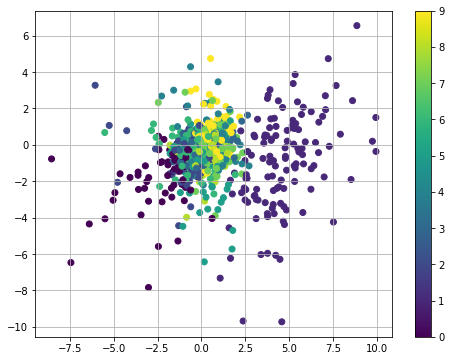

torch.Size([1, 12])


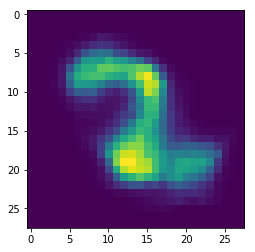

('recon_loss:', 0.167660191655159)


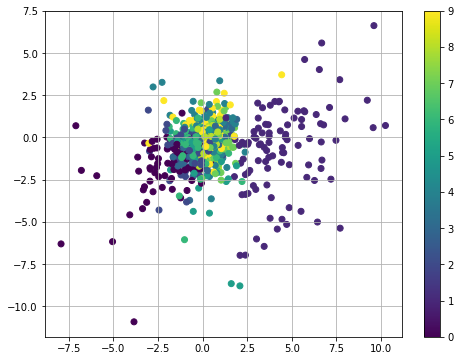

torch.Size([1, 12])


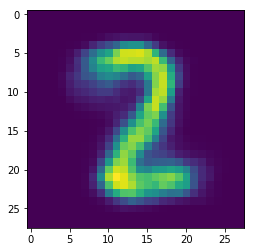

('recon_loss:', 0.14921817183494568)


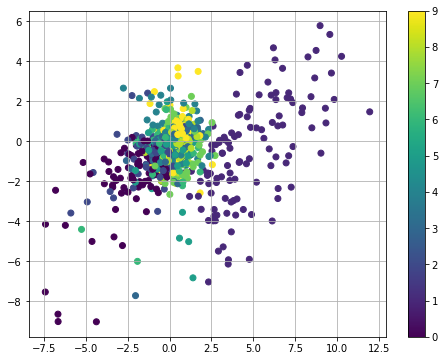

torch.Size([1, 12])


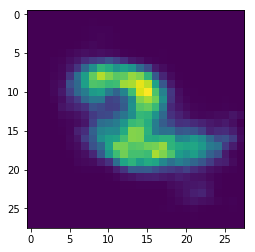

('recon_loss:', 0.1542837917804718)


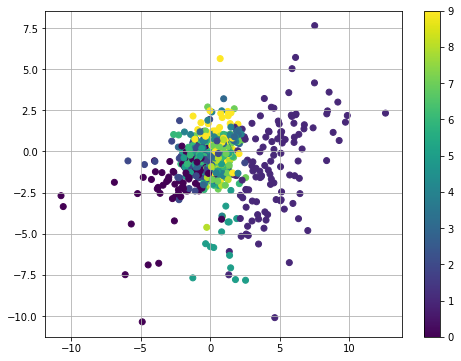

torch.Size([1, 12])


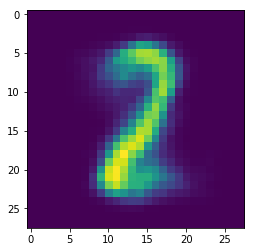

('recon_loss:', 0.1507401466369629)


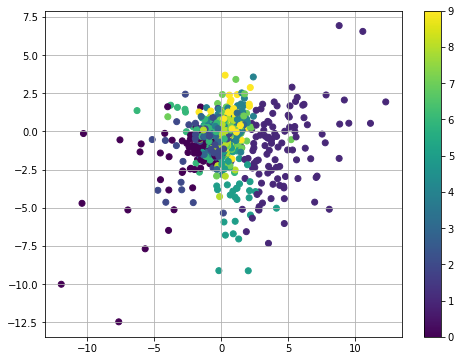

torch.Size([1, 12])


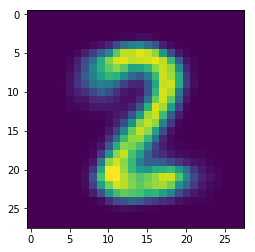

('recon_loss:', 0.15807975828647614)


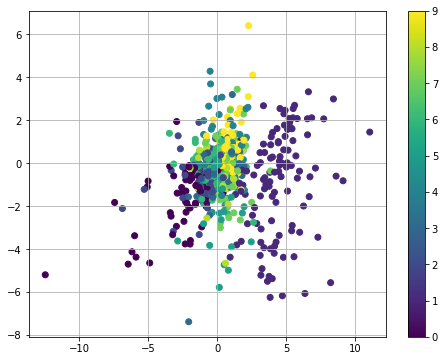

torch.Size([1, 12])


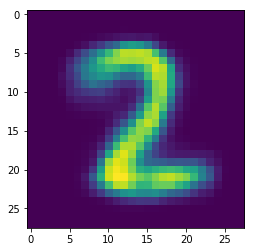

('recon_loss:', 0.15709571540355682)


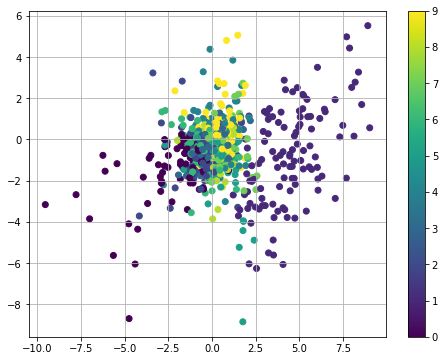

torch.Size([1, 12])


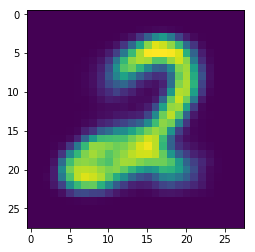

('recon_loss:', 0.16216613352298737)


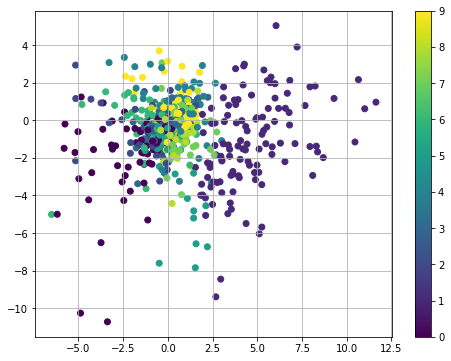

torch.Size([1, 12])


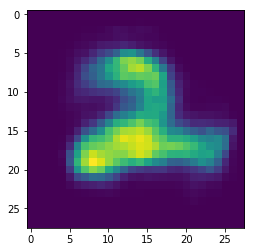

('recon_loss:', 0.1638326346874237)


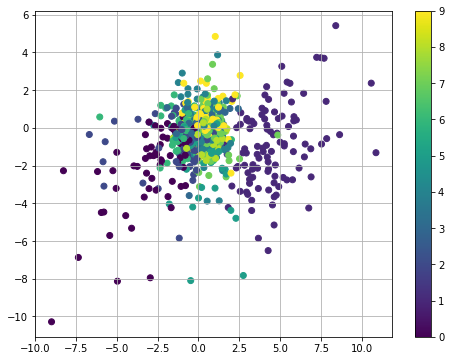

torch.Size([1, 12])


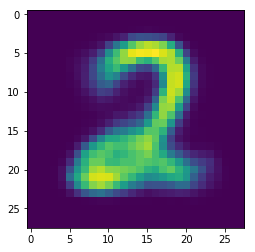

('recon_loss:', 0.16602422297000885)


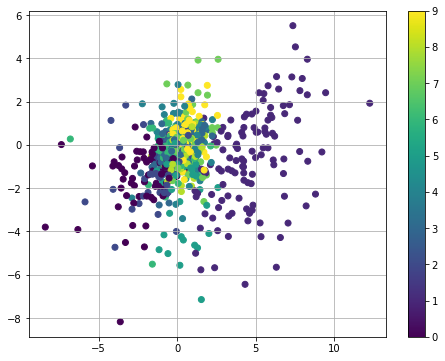

torch.Size([1, 12])


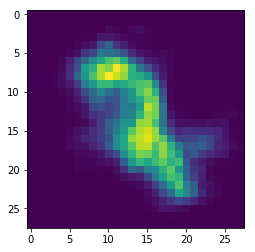

('recon_loss:', 0.15990149974822998)


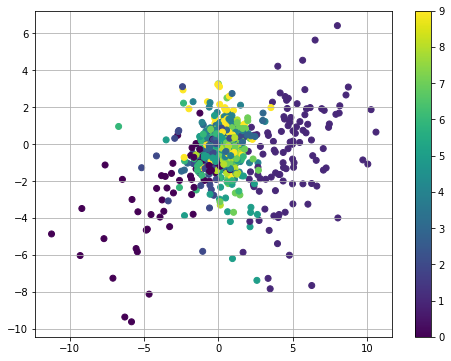

torch.Size([1, 12])


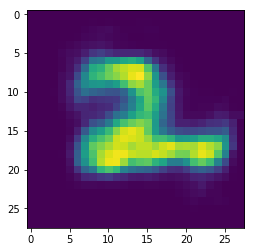

('recon_loss:', 0.1655750721693039)


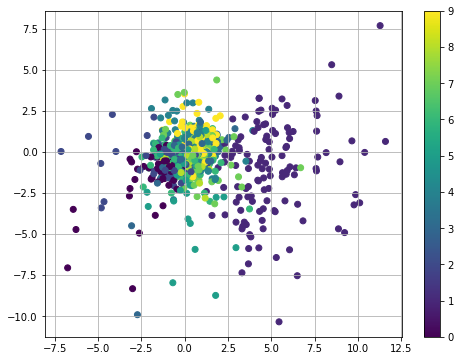

torch.Size([1, 12])


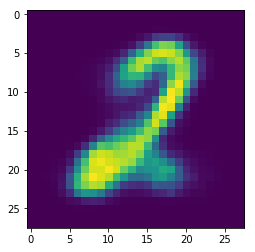

('recon_loss:', 0.16204272210597992)


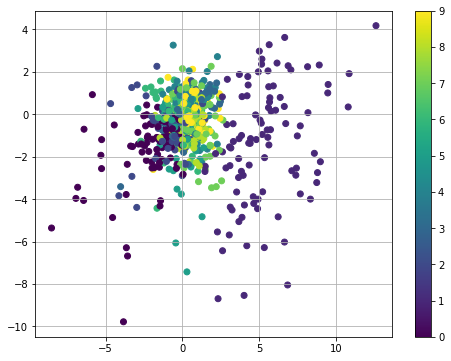

torch.Size([1, 12])


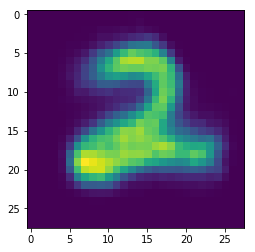

('recon_loss:', 0.1558389663696289)


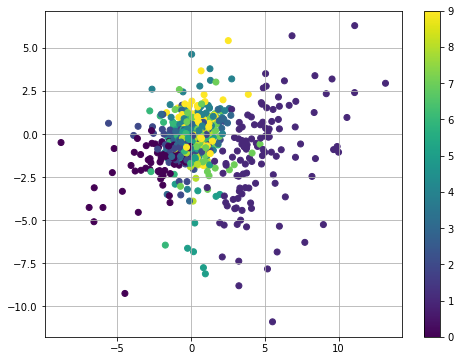

torch.Size([1, 12])


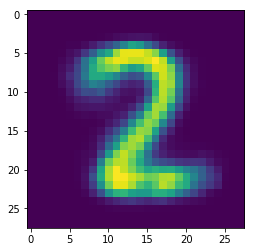

('recon_loss:', 0.16818256676197052)


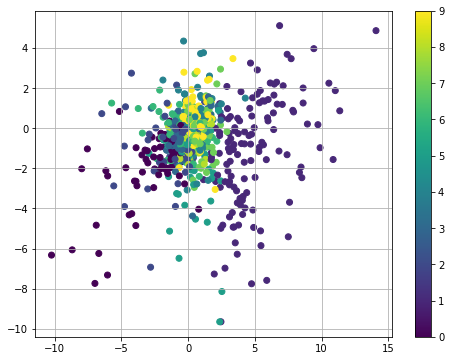

torch.Size([1, 12])


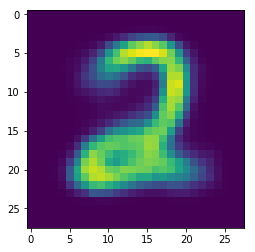

('recon_loss:', 0.16291062533855438)


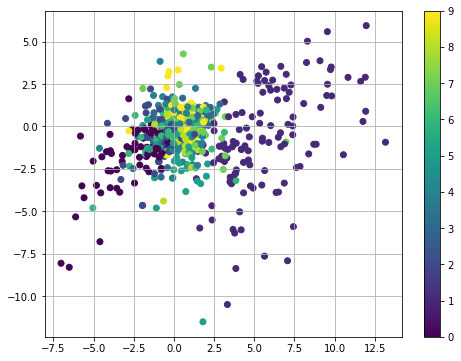

torch.Size([1, 12])


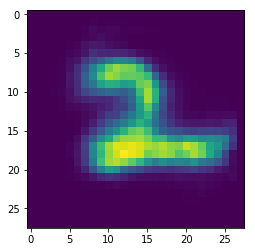

('recon_loss:', 0.15147188305854797)


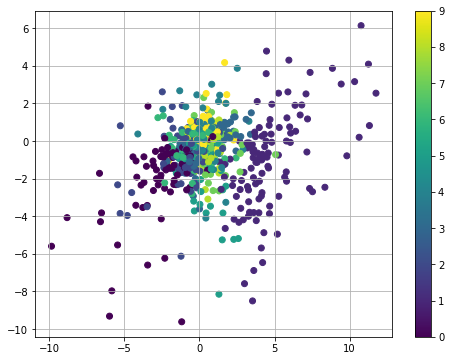

torch.Size([1, 12])


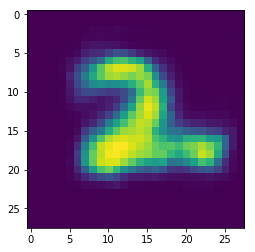

('recon_loss:', 0.1610783338546753)


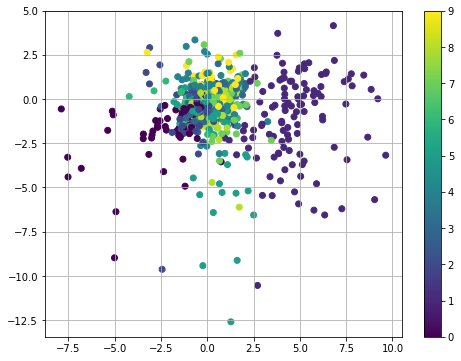

torch.Size([1, 12])


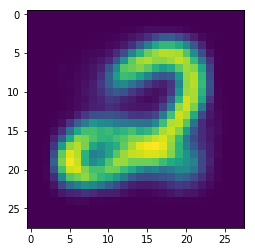

('recon_loss:', 0.16174812614917755)


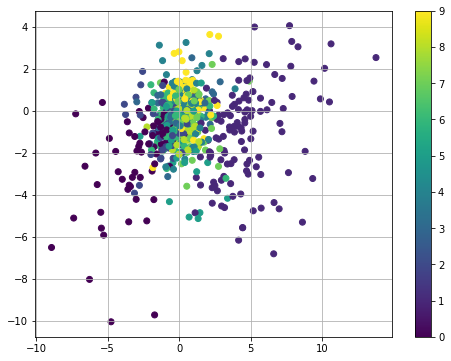

torch.Size([1, 12])


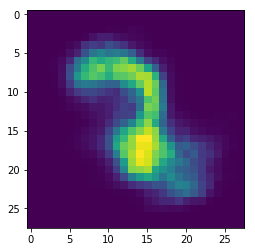

('recon_loss:', 0.16312210261821747)


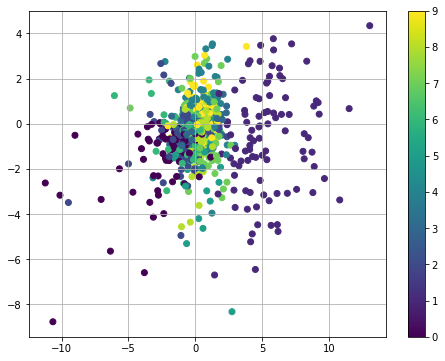

torch.Size([1, 12])


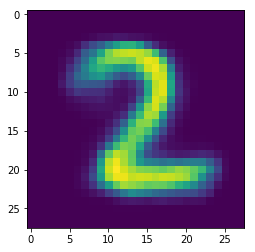

('recon_loss:', 0.15132887661457062)


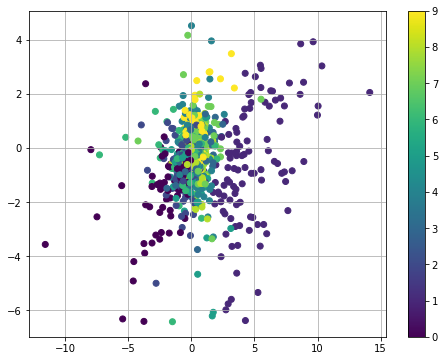

torch.Size([1, 12])


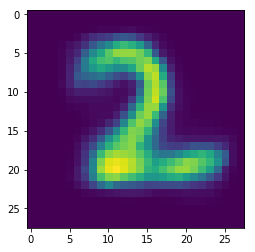

('recon_loss:', 0.1659017950296402)


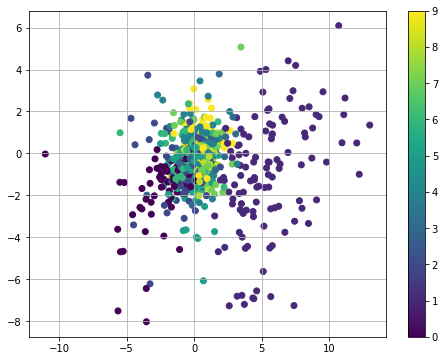

torch.Size([1, 12])


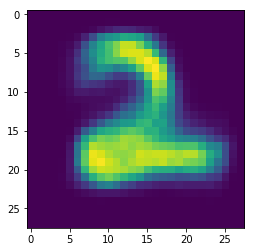

('recon_loss:', 0.16389325261116028)


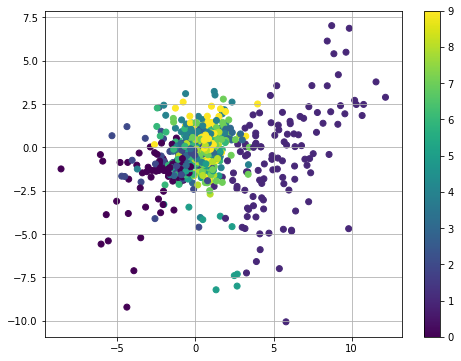

torch.Size([1, 12])


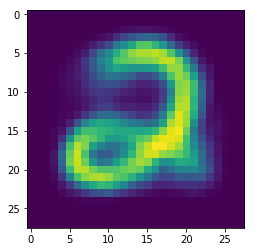

('recon_loss:', 0.16403119266033173)


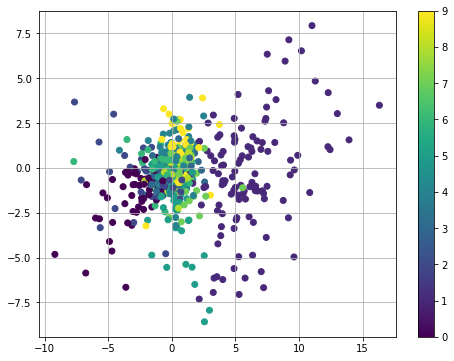

torch.Size([1, 12])


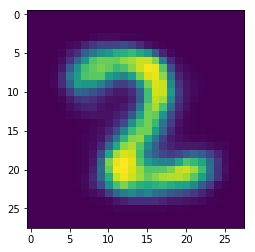

('recon_loss:', 0.15738265216350555)


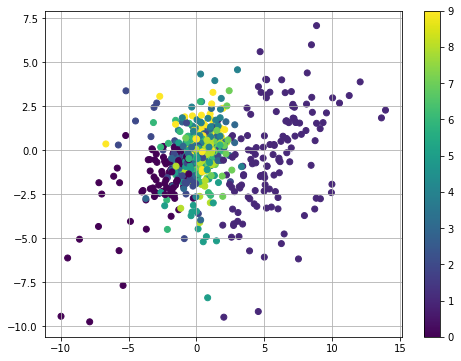

torch.Size([1, 12])


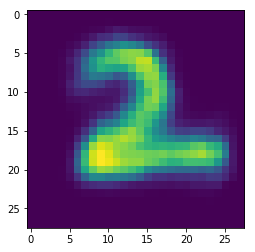

('recon_loss:', 0.16941706836223602)


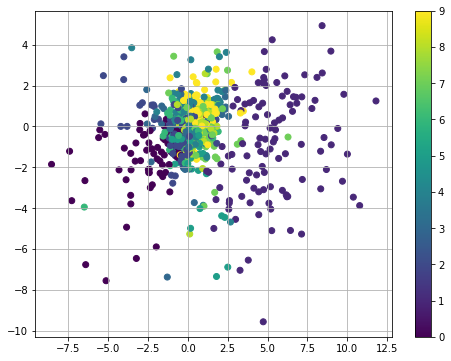

torch.Size([1, 12])


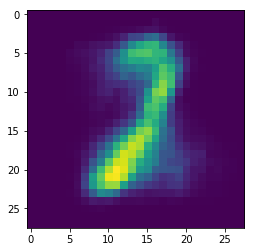

('recon_loss:', 0.15821851789951324)


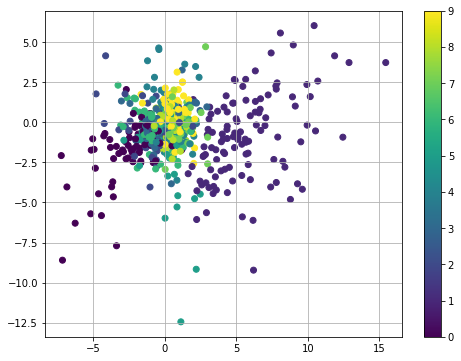

torch.Size([1, 12])


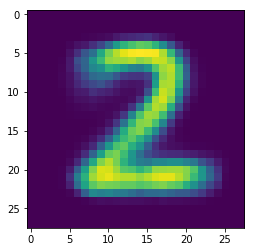

('recon_loss:', 0.1625998616218567)


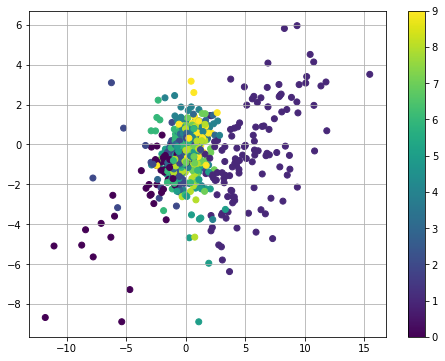

torch.Size([1, 12])


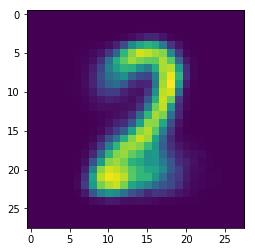

('recon_loss:', 0.15706372261047363)


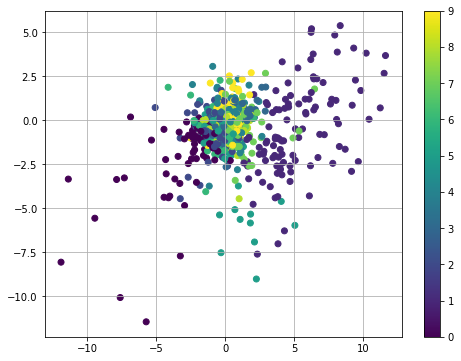

torch.Size([1, 12])


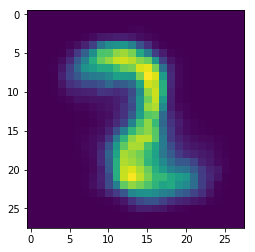

('recon_loss:', 0.16123564541339874)


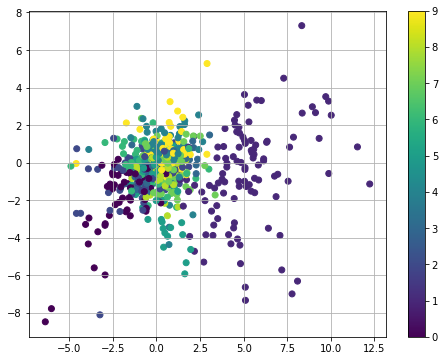

torch.Size([1, 12])


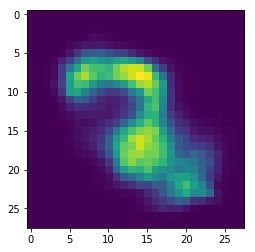

('recon_loss:', 0.15730848908424377)


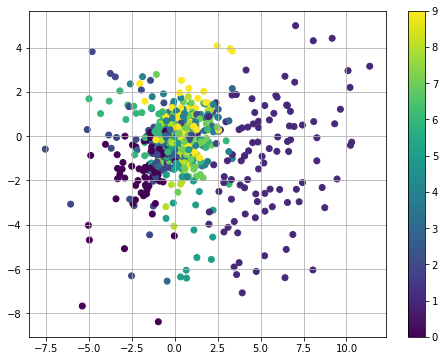

torch.Size([1, 12])


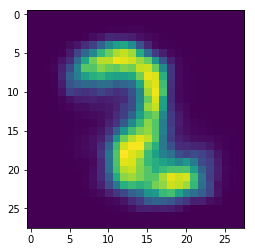

('recon_loss:', 0.15459388494491577)


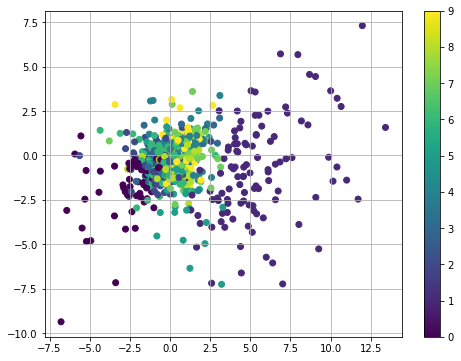

torch.Size([1, 12])


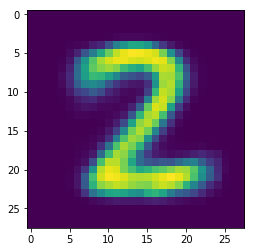

('recon_loss:', 0.15521441400051117)


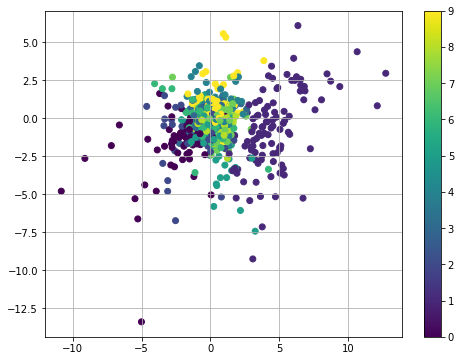

torch.Size([1, 12])


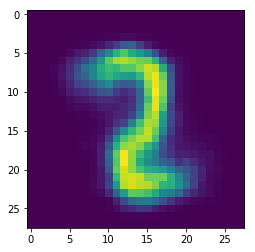

('recon_loss:', 0.15776440501213074)


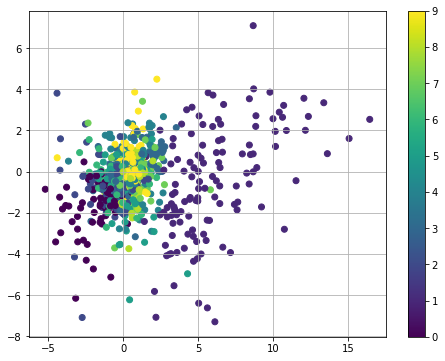

torch.Size([1, 12])


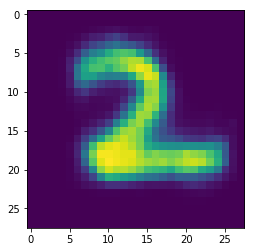

('recon_loss:', 0.15348850190639496)


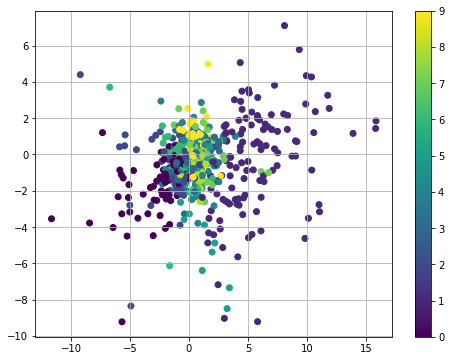

torch.Size([1, 12])


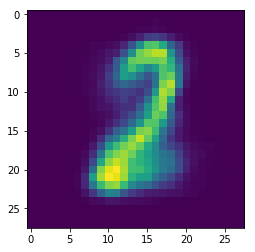

('recon_loss:', 0.15319986641407013)


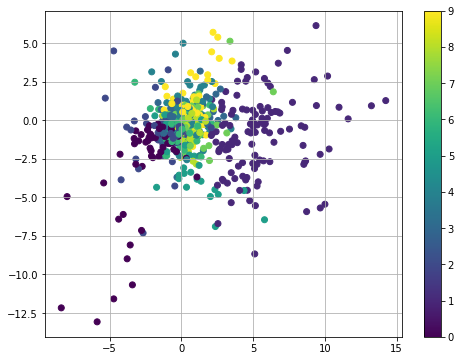

torch.Size([1, 12])


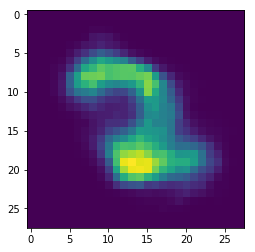

('recon_loss:', 0.16603770852088928)


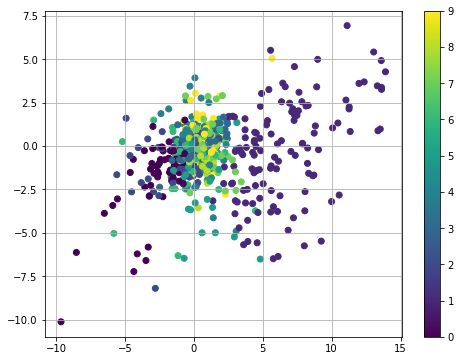

torch.Size([1, 12])


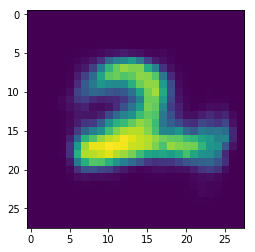

('recon_loss:', 0.1526486575603485)


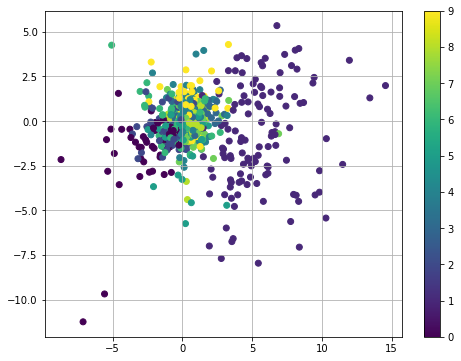

torch.Size([1, 12])


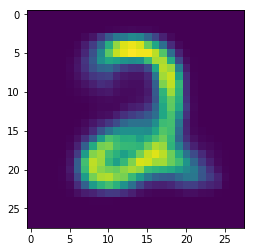

('recon_loss:', 0.16229021549224854)


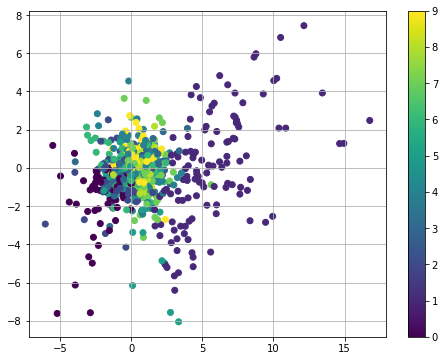

torch.Size([1, 12])


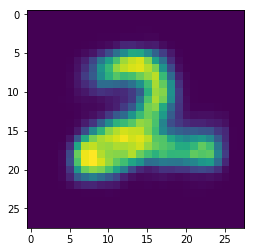

('recon_loss:', 0.15909598767757416)


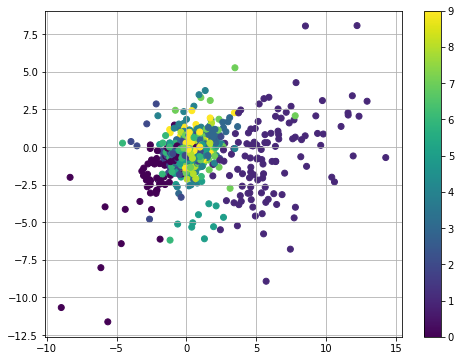

torch.Size([1, 12])


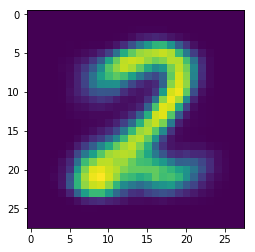

('recon_loss:', 0.16543765366077423)


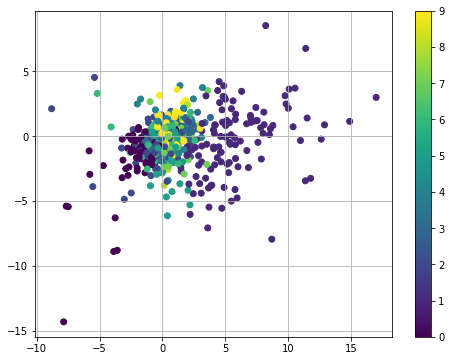

torch.Size([1, 12])


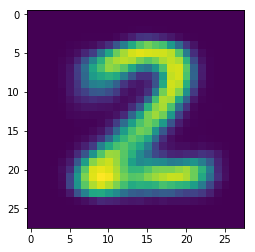

('recon_loss:', 0.15975242853164673)


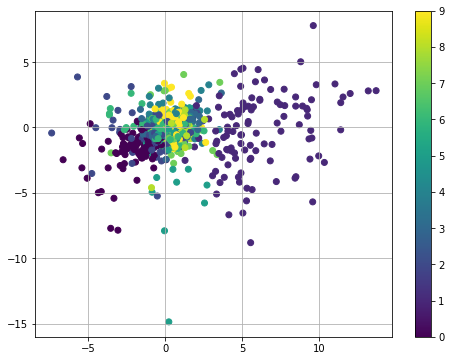

torch.Size([1, 12])


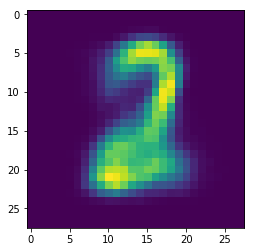

('recon_loss:', 0.16429832577705383)


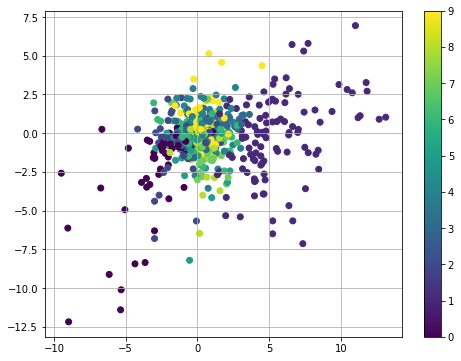

torch.Size([1, 12])


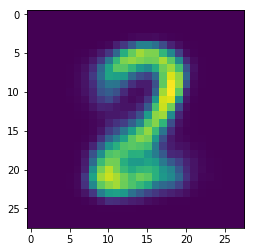

('recon_loss:', 0.1544724404811859)


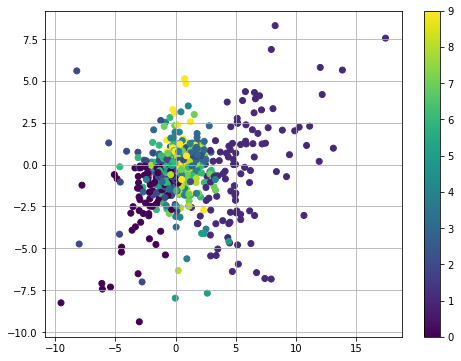

torch.Size([1, 12])


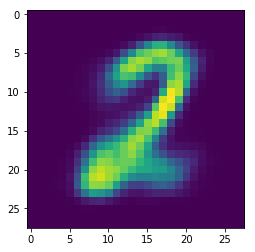

('recon_loss:', 0.1610356867313385)


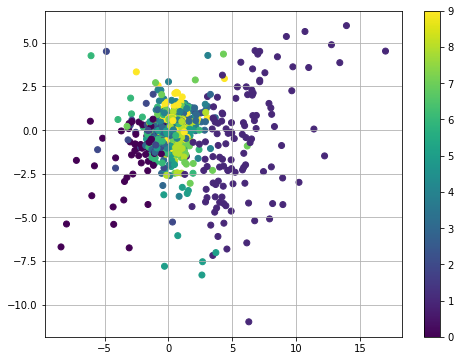

torch.Size([1, 12])


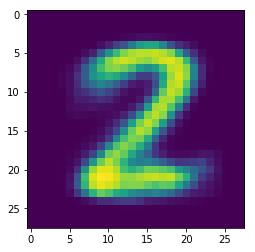

('recon_loss:', 0.1466706097126007)


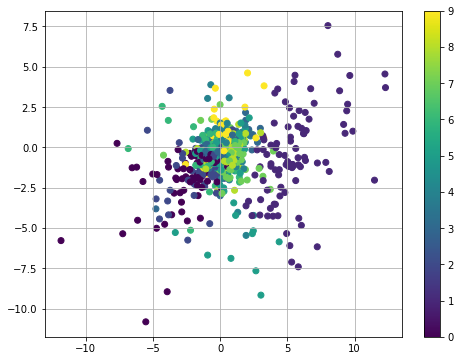

torch.Size([1, 12])


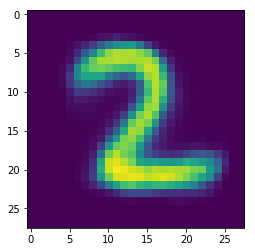

('recon_loss:', 0.1660461276769638)


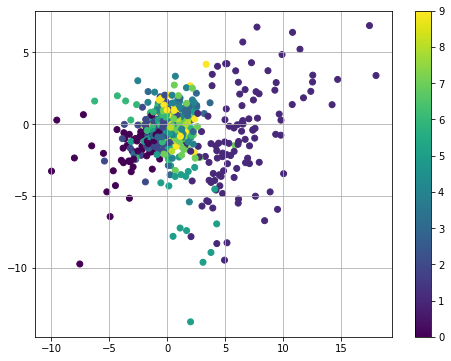

torch.Size([1, 12])


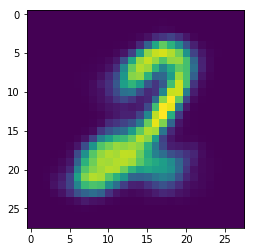

('recon_loss:', 0.16208618879318237)


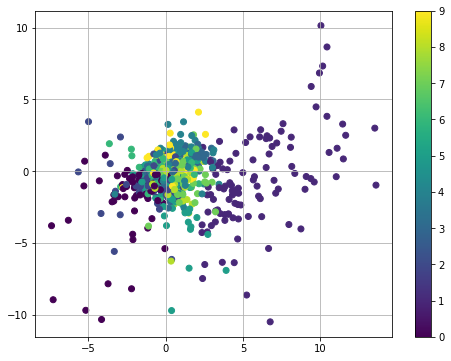

torch.Size([1, 12])


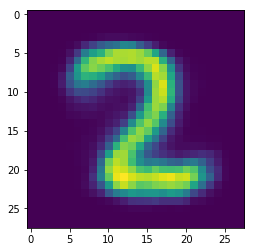

('recon_loss:', 0.16218961775302887)


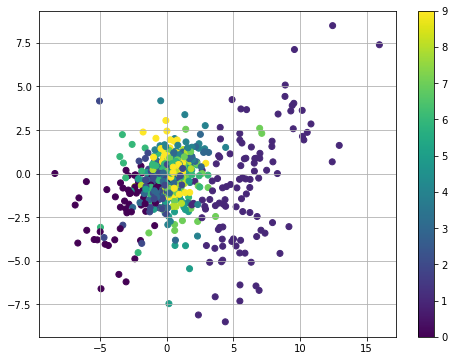

torch.Size([1, 12])


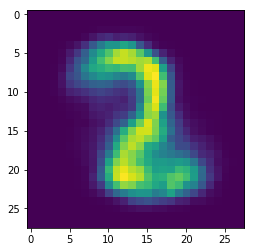

('recon_loss:', 0.15042906999588013)


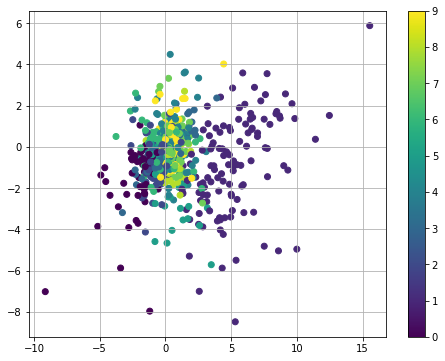

torch.Size([1, 12])


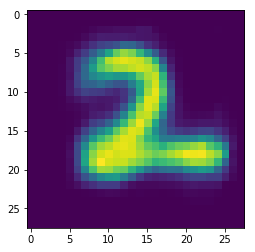

('recon_loss:', 0.15739254653453827)


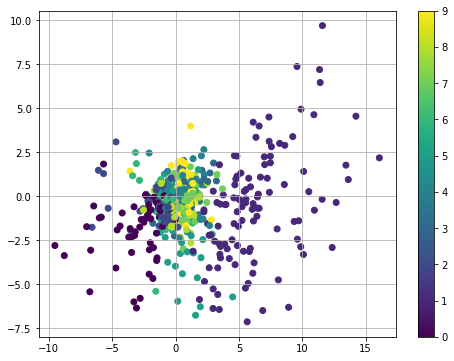

torch.Size([1, 12])


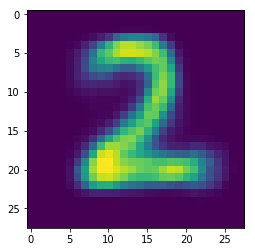

('recon_loss:', 0.16186362504959106)


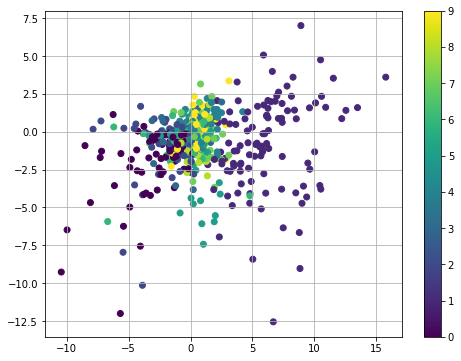

torch.Size([1, 12])


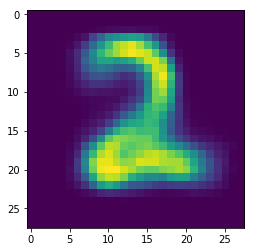

('recon_loss:', 0.1600370556116104)


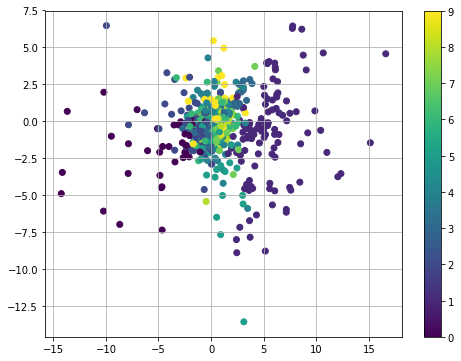

torch.Size([1, 12])


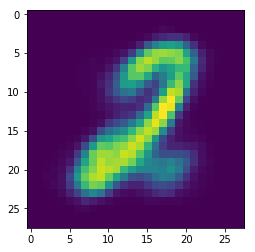

('recon_loss:', 0.15443308651447296)


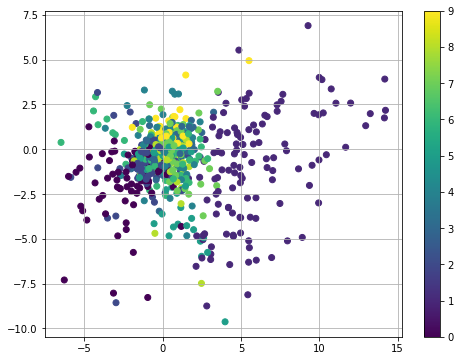

torch.Size([1, 12])


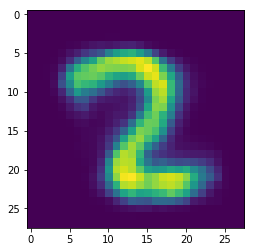

('recon_loss:', 0.15271563827991486)


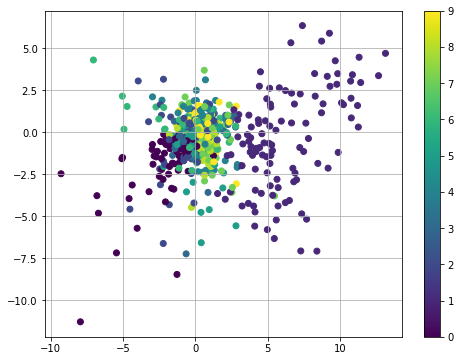

torch.Size([1, 12])


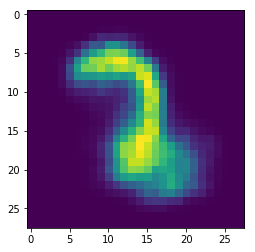

('recon_loss:', 0.1587076187133789)


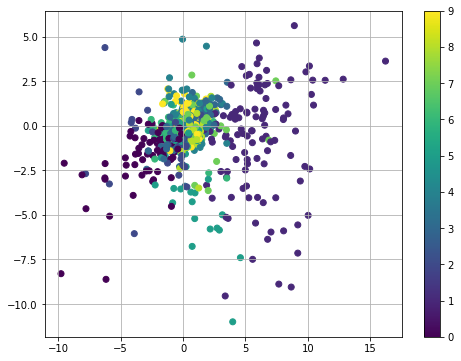

torch.Size([1, 12])


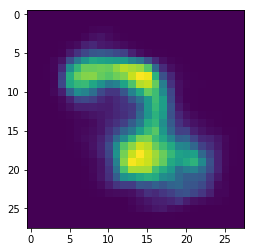

('recon_loss:', 0.1516137421131134)


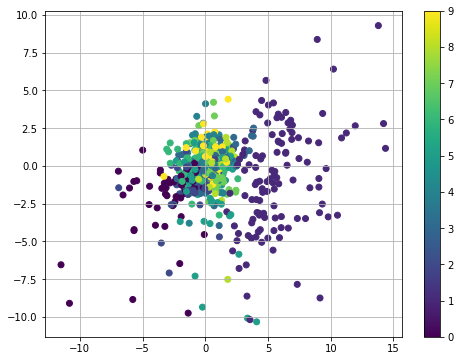

torch.Size([1, 12])


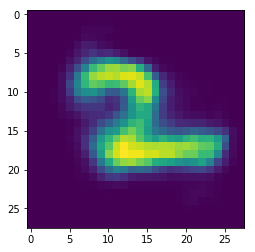

('recon_loss:', 0.15259861946105957)


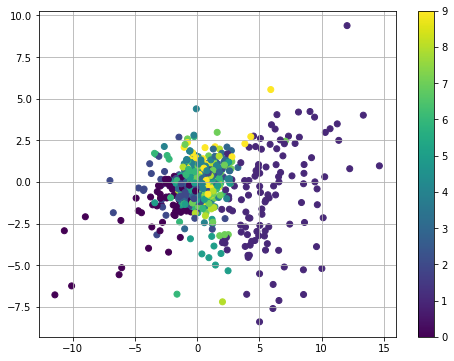

torch.Size([1, 12])


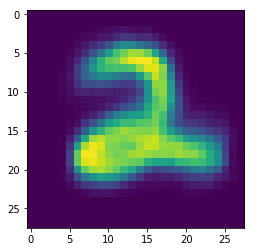

('recon_loss:', 0.16090117394924164)


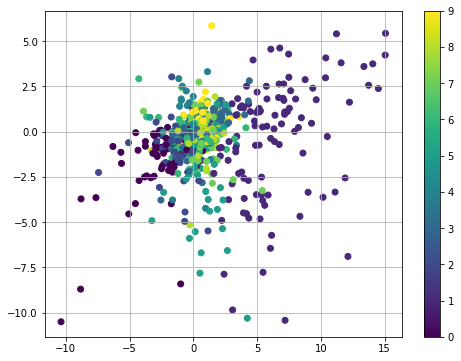

torch.Size([1, 12])


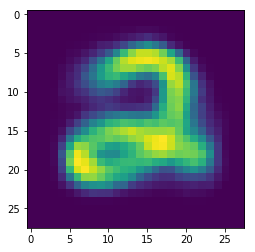

('recon_loss:', 0.15814298391342163)


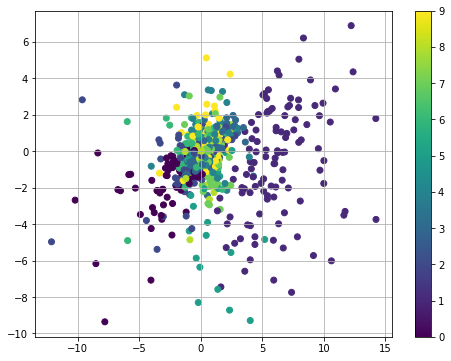

torch.Size([1, 12])


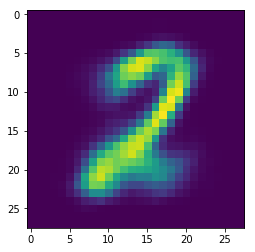

('recon_loss:', 0.16083230078220367)


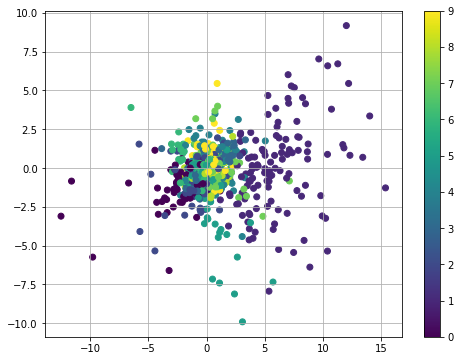

torch.Size([1, 12])


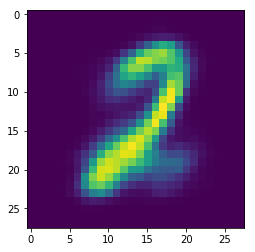

('recon_loss:', 0.15944769978523254)


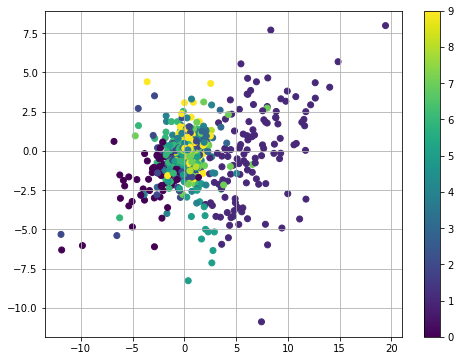

torch.Size([1, 12])


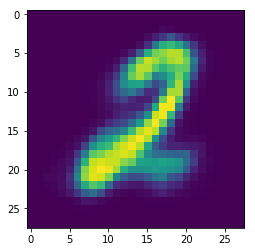

('recon_loss:', 0.16211368143558502)


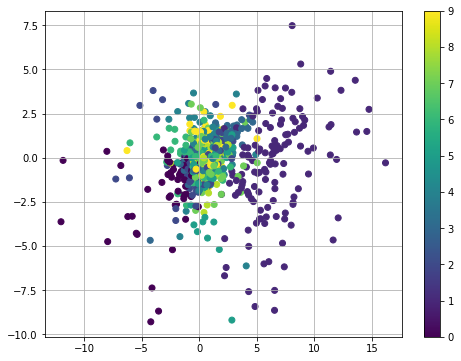

torch.Size([1, 12])


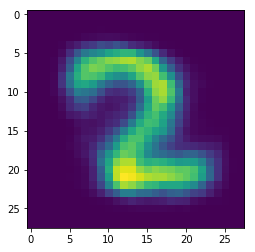

('recon_loss:', 0.15969084203243256)


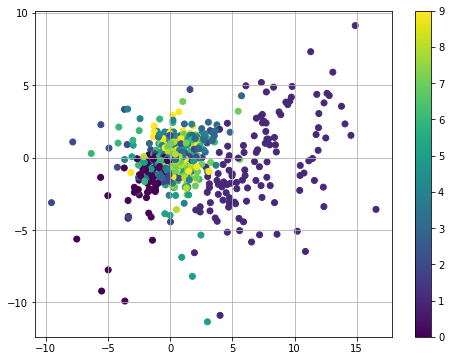

torch.Size([1, 12])


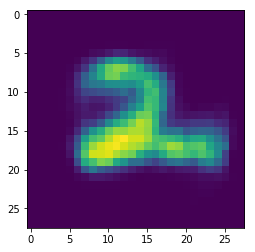

('recon_loss:', 0.14936555922031403)


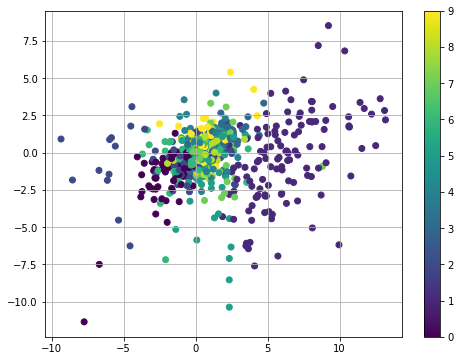

torch.Size([1, 12])


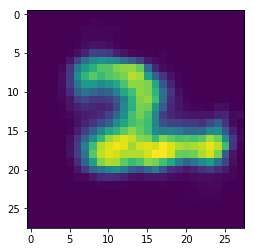

('recon_loss:', 0.1632123589515686)


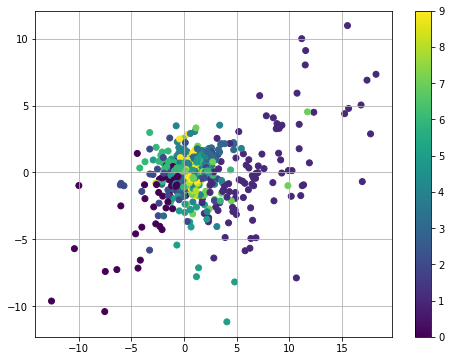

torch.Size([1, 12])


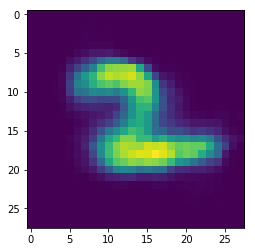

('recon_loss:', 0.16204223036766052)


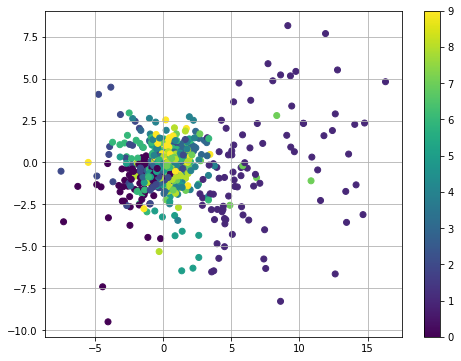

torch.Size([1, 12])


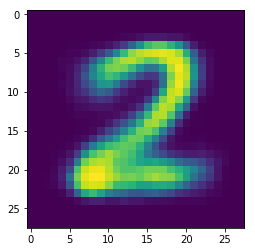

('recon_loss:', 0.15893107652664185)


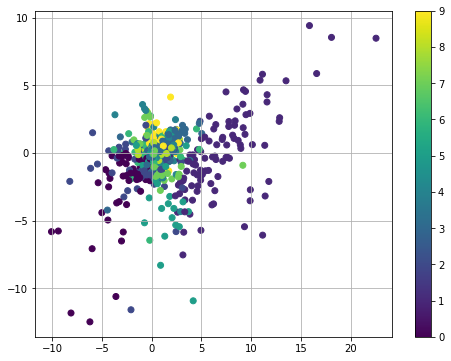

torch.Size([1, 12])


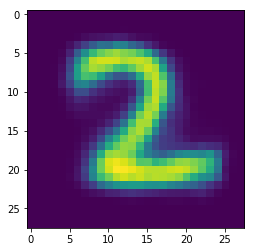

('recon_loss:', 0.15994417667388916)


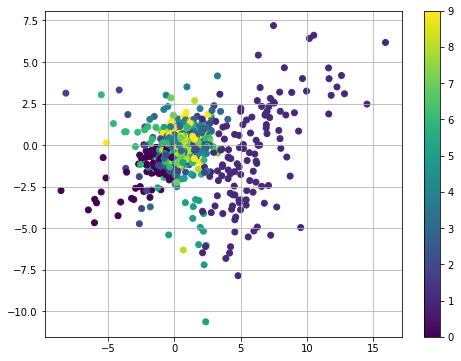

torch.Size([1, 12])


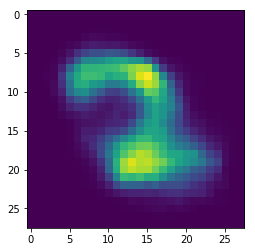

('recon_loss:', 0.15905429422855377)


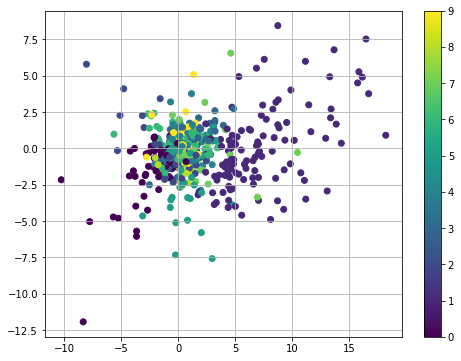

torch.Size([1, 12])


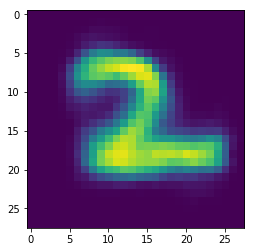

('recon_loss:', 0.15205149352550507)


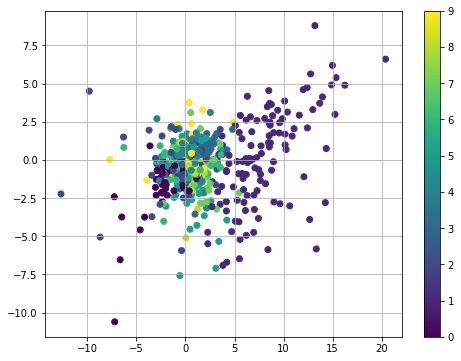

torch.Size([1, 12])


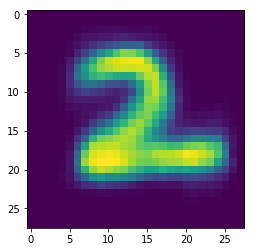

('recon_loss:', 0.16342394053936005)


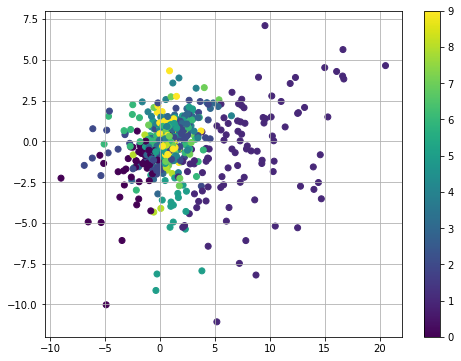

torch.Size([1, 12])


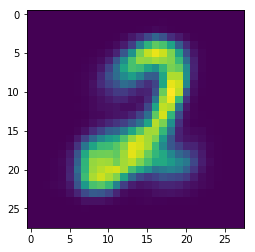

('recon_loss:', 0.16218844056129456)


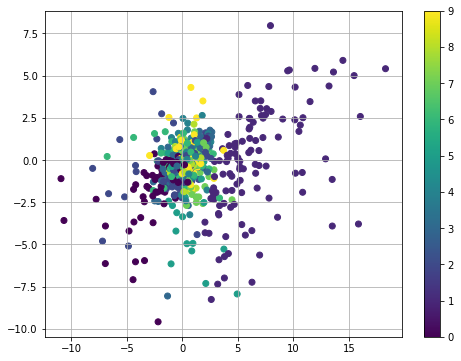

torch.Size([1, 12])


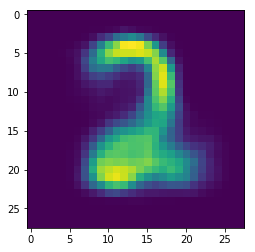

('recon_loss:', 0.16263101994991302)


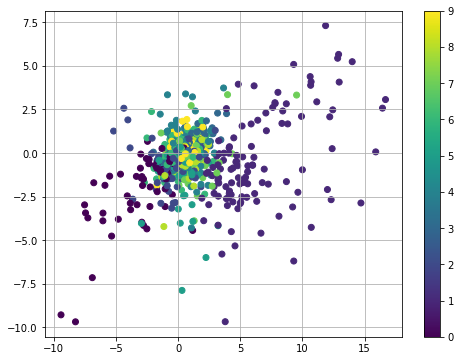

torch.Size([1, 12])


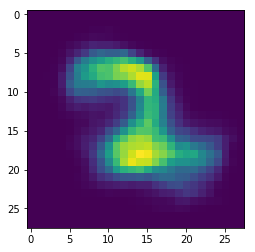

('recon_loss:', 0.1625811755657196)


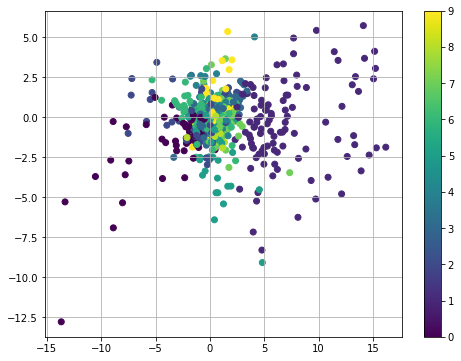

torch.Size([1, 12])


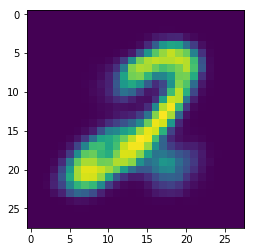

('recon_loss:', 0.1377459168434143)


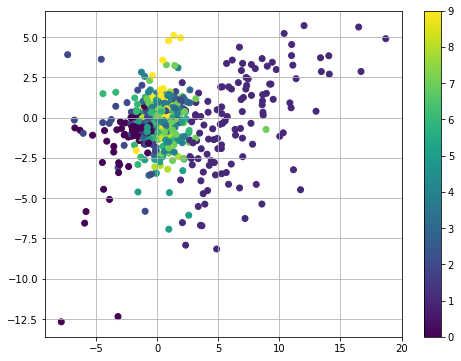

torch.Size([1, 12])


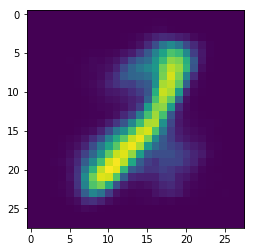

('recon_loss:', 0.16254037618637085)


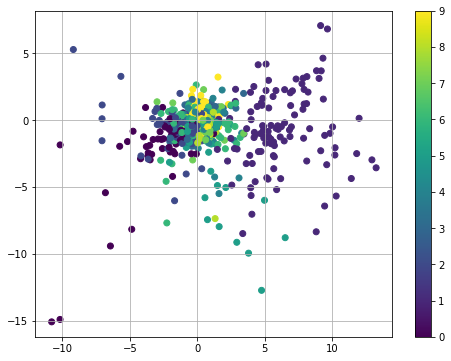

torch.Size([1, 12])


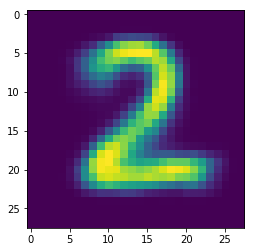

('recon_loss:', 0.1661187708377838)


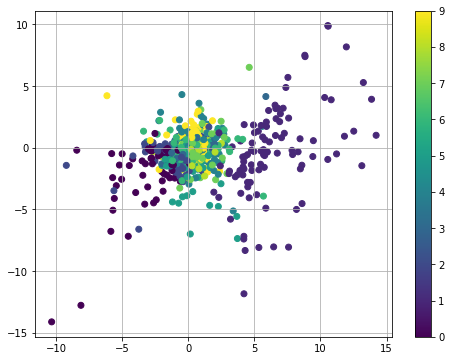

torch.Size([1, 12])


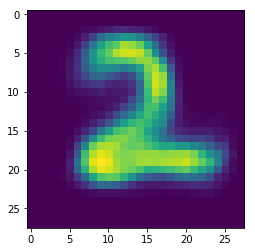

('recon_loss:', 0.16038380563259125)


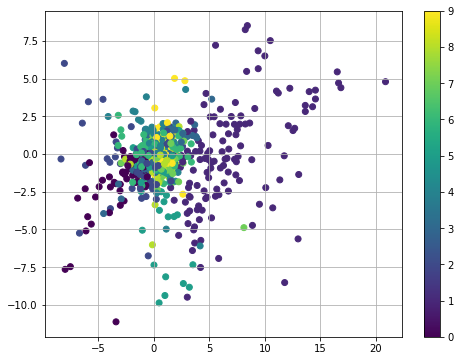

torch.Size([1, 12])


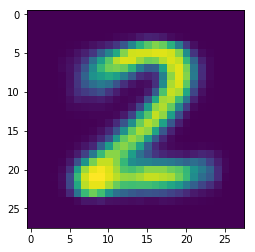

('recon_loss:', 0.15435102581977844)


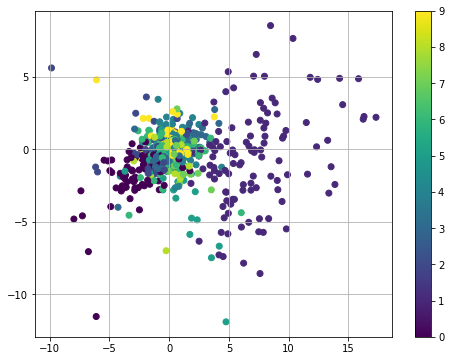

torch.Size([1, 12])


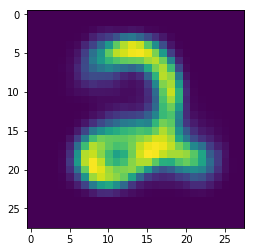

('recon_loss:', 0.15167833864688873)


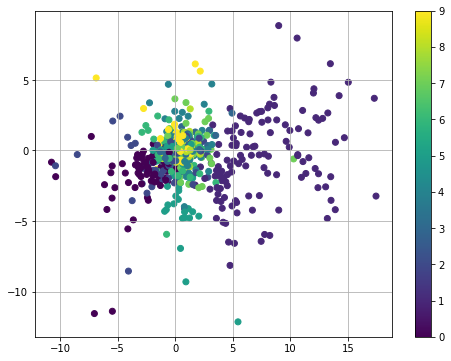

torch.Size([1, 12])


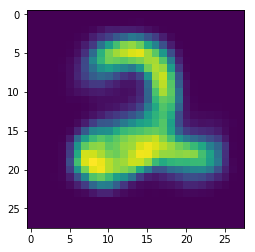

('recon_loss:', 0.16856108605861664)


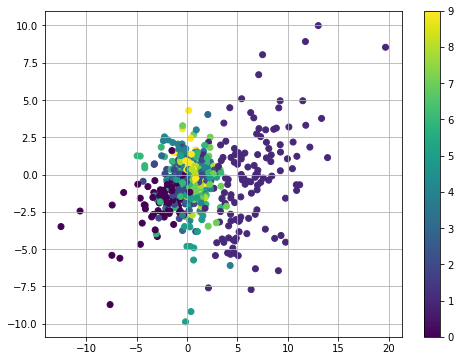

torch.Size([1, 12])


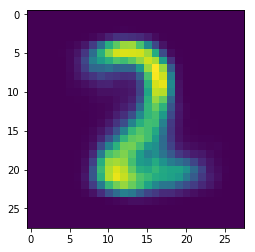

('recon_loss:', 0.15612204372882843)


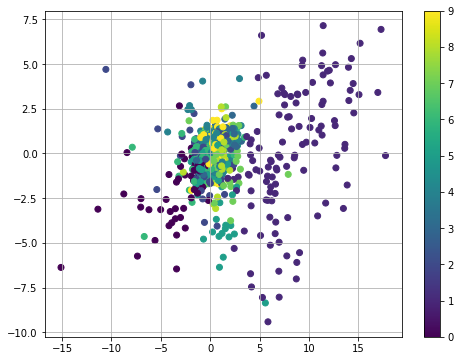

torch.Size([1, 12])


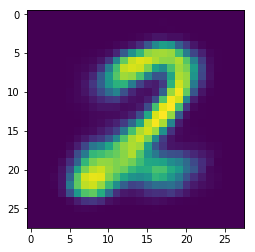

('recon_loss:', 0.15569685399532318)


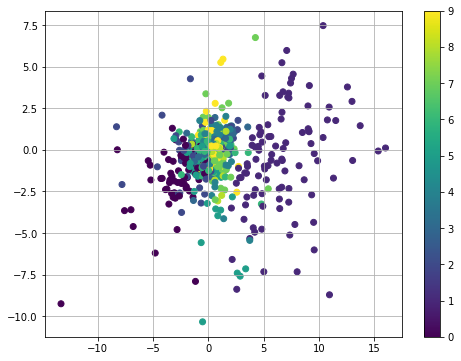

torch.Size([1, 12])


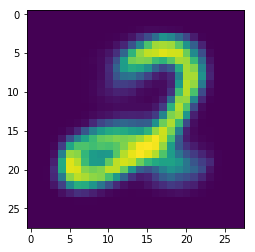

('recon_loss:', 0.16348719596862793)


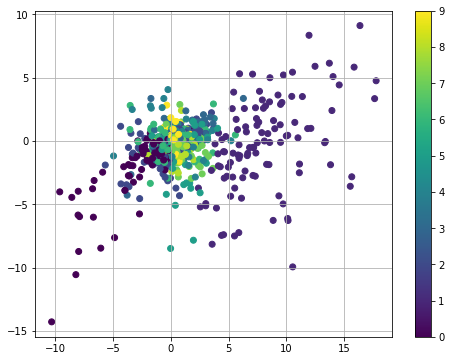

torch.Size([1, 12])


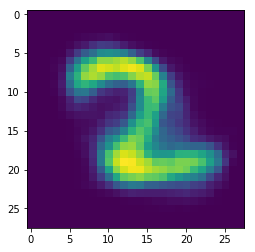

('recon_loss:', 0.16765685379505157)


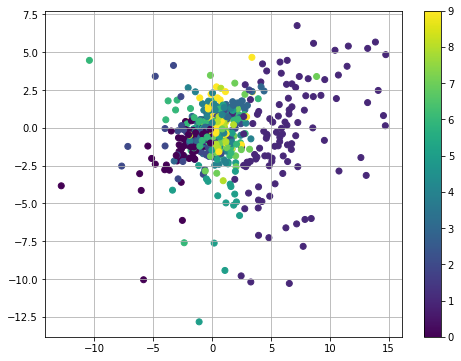

torch.Size([1, 12])


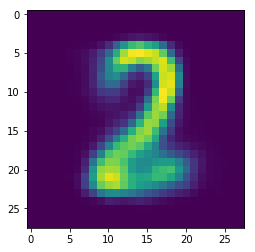

('recon_loss:', 0.15384334325790405)


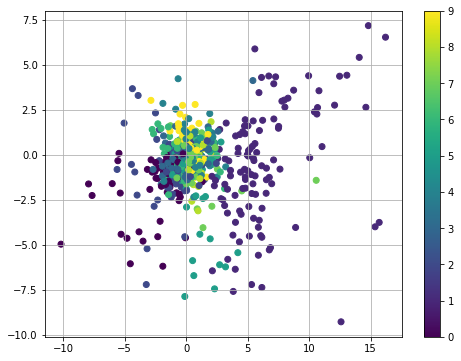

torch.Size([1, 12])


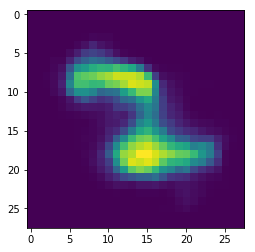

('recon_loss:', 0.15017879009246826)


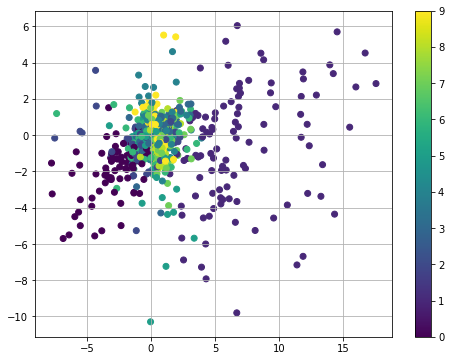

torch.Size([1, 12])


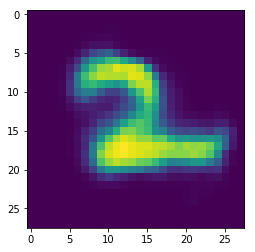

('recon_loss:', 0.1607447862625122)


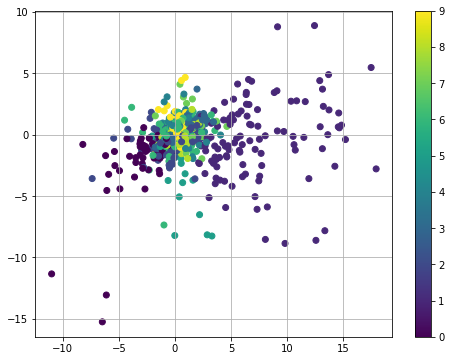

torch.Size([1, 12])


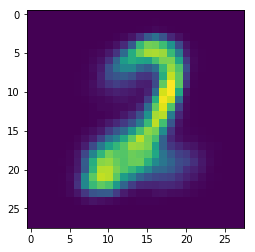

('recon_loss:', 0.16275015473365784)


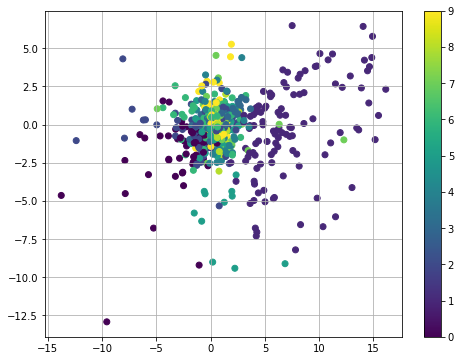

torch.Size([1, 12])


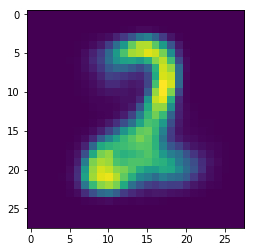

('recon_loss:', 0.15658040344715118)


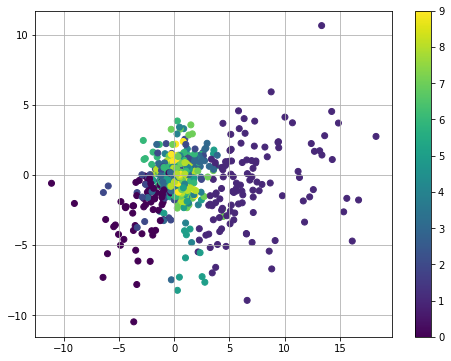

torch.Size([1, 12])


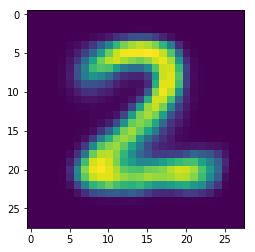

('recon_loss:', 0.1640554666519165)


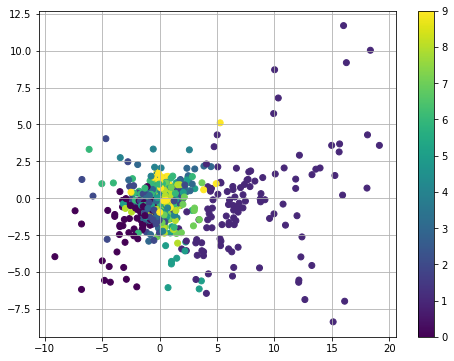

torch.Size([1, 12])


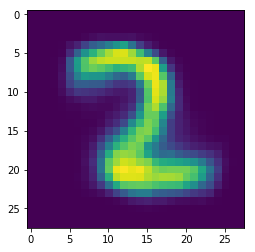

('recon_loss:', 0.16454723477363586)


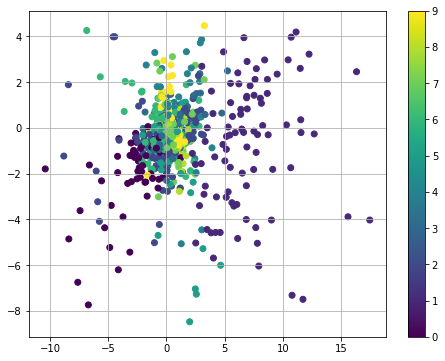

torch.Size([1, 12])


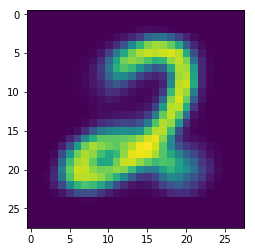

('recon_loss:', 0.16326580941677094)


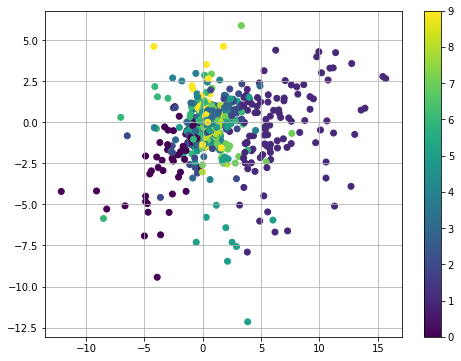

torch.Size([1, 12])


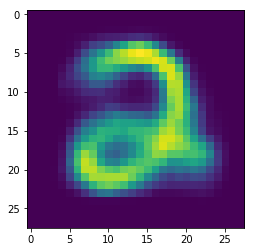

('recon_loss:', 0.16261599957942963)


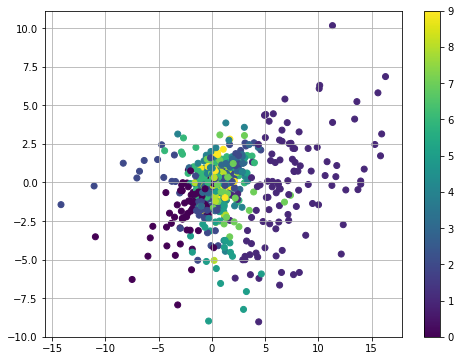

torch.Size([1, 12])


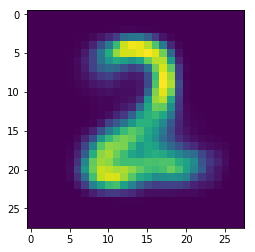

('recon_loss:', 0.1621471792459488)


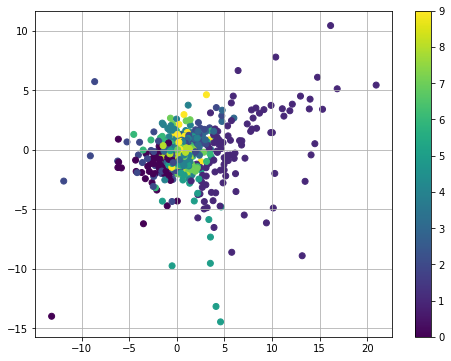

torch.Size([1, 12])


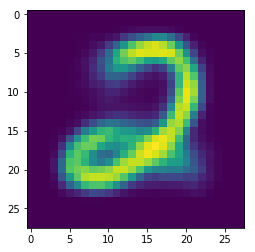

('recon_loss:', 0.149825781583786)


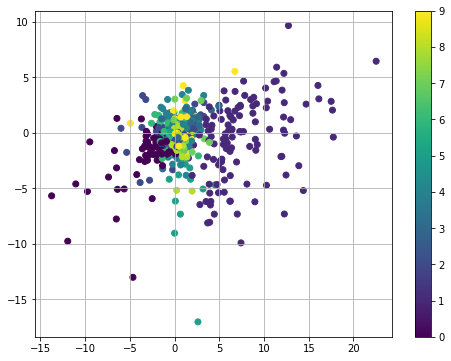

torch.Size([1, 12])


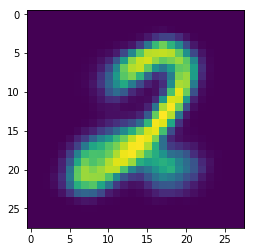

('recon_loss:', 0.15016743540763855)


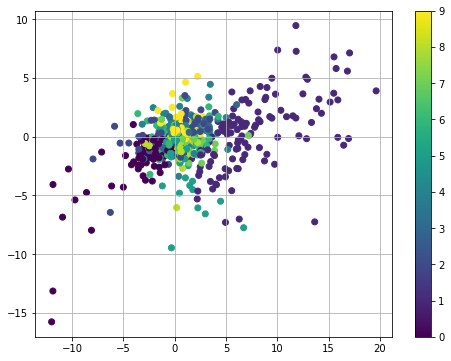

torch.Size([1, 12])


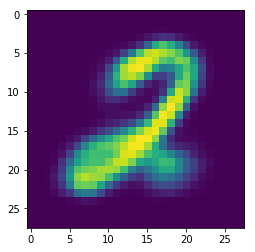

('recon_loss:', 0.1655774861574173)


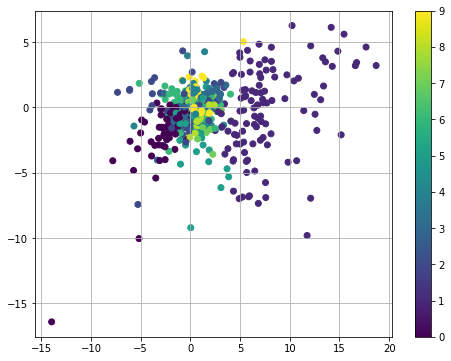

torch.Size([1, 12])


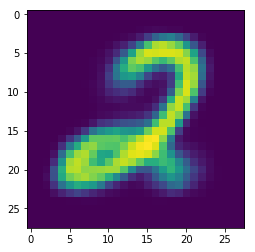

('recon_loss:', 0.1570947915315628)


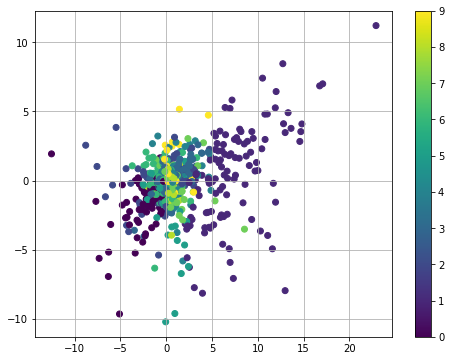

torch.Size([1, 12])


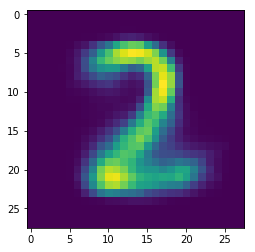

('recon_loss:', 0.1576312929391861)


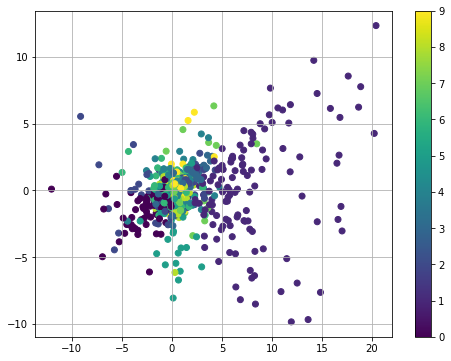

torch.Size([1, 12])


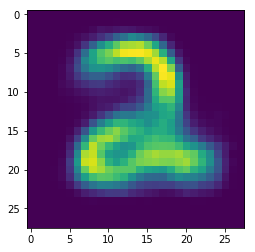

('recon_loss:', 0.14943140745162964)


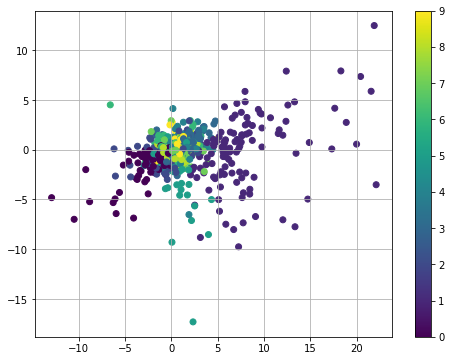

torch.Size([1, 12])


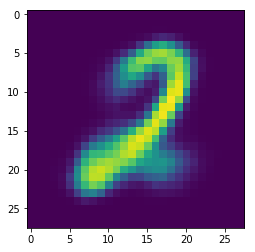

('recon_loss:', 0.15338601171970367)


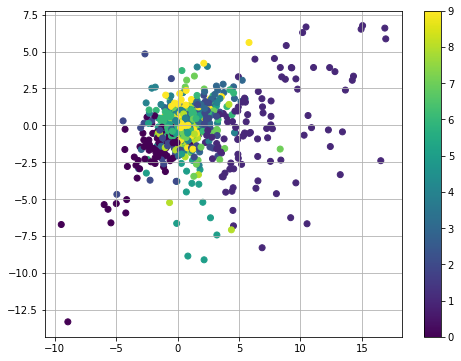

torch.Size([1, 12])


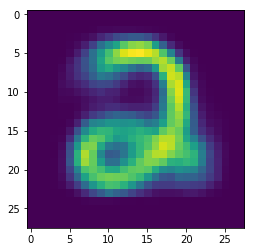

('recon_loss:', 0.15280017256736755)


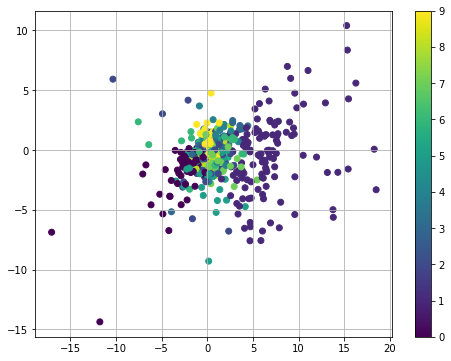

torch.Size([1, 12])


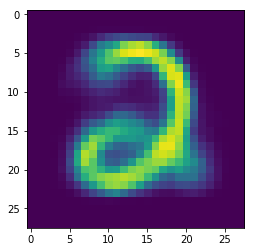

('recon_loss:', 0.1548781841993332)


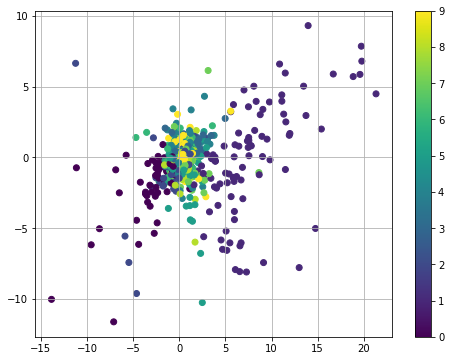

torch.Size([1, 12])


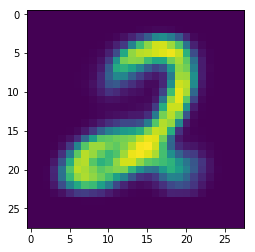

('recon_loss:', 0.15189814567565918)


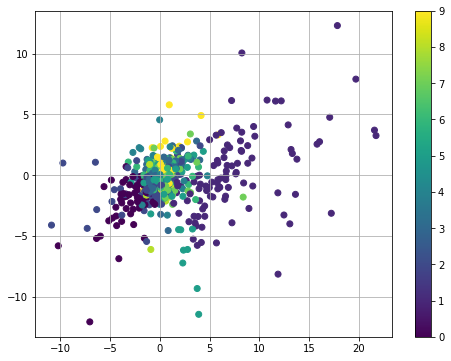

torch.Size([1, 12])


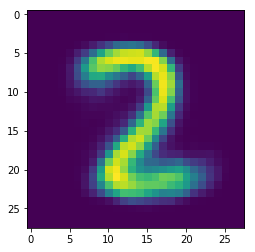

('recon_loss:', 0.15850700438022614)


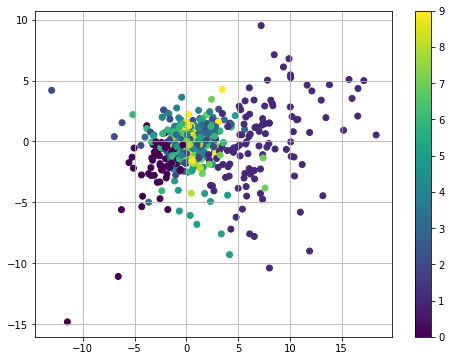

torch.Size([1, 12])


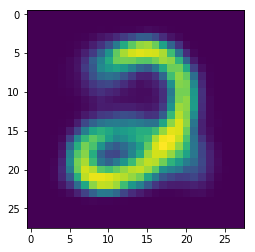

('recon_loss:', 0.15785248577594757)


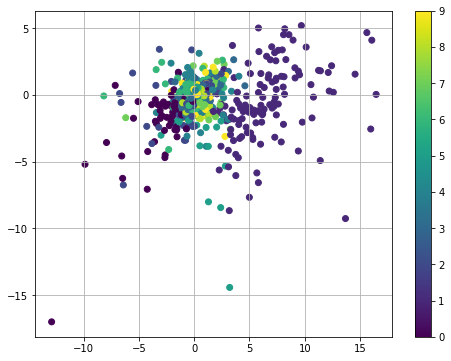

torch.Size([1, 12])


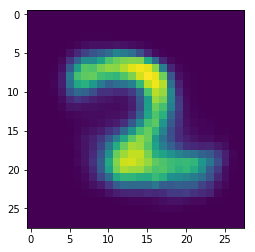

('recon_loss:', 0.14976869523525238)


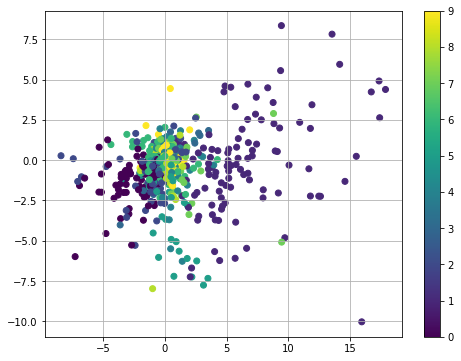

torch.Size([1, 12])


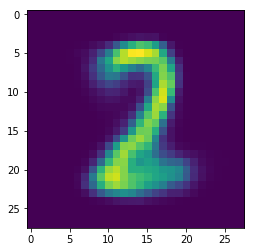

('recon_loss:', 0.15958702564239502)


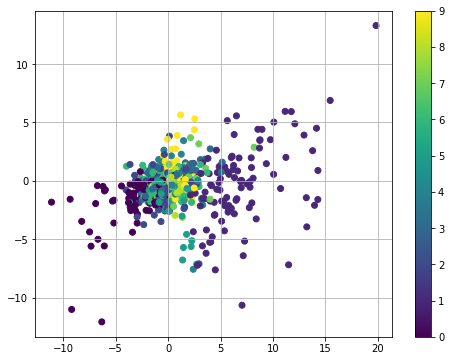

torch.Size([1, 12])


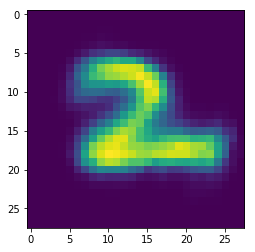

('recon_loss:', 0.1552848368883133)


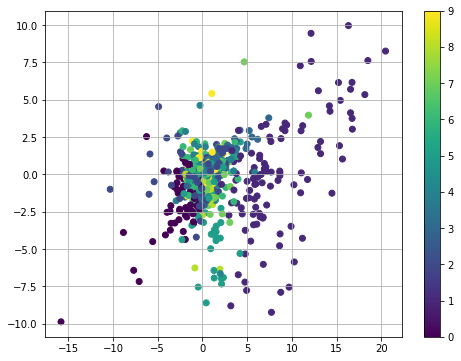

torch.Size([1, 12])


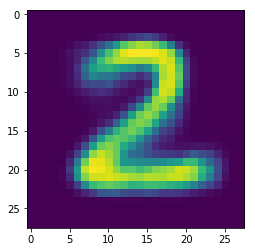

('recon_loss:', 0.1534518301486969)


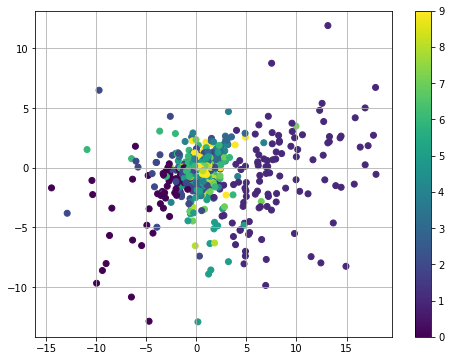

torch.Size([1, 12])


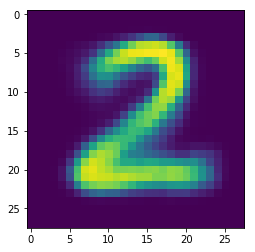

('recon_loss:', 0.15183596312999725)


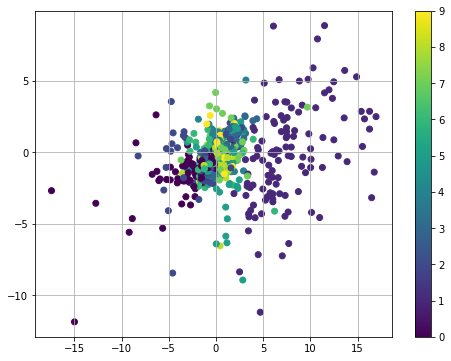

torch.Size([1, 12])


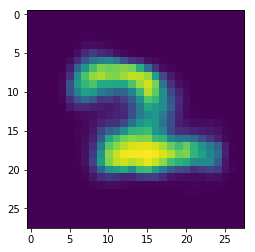

('recon_loss:', 0.17084145545959473)


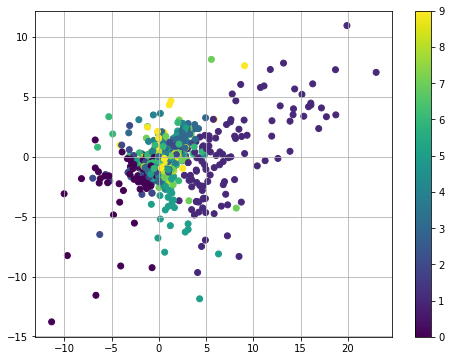

torch.Size([1, 12])


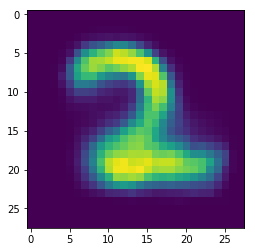

('recon_loss:', 0.16344255208969116)


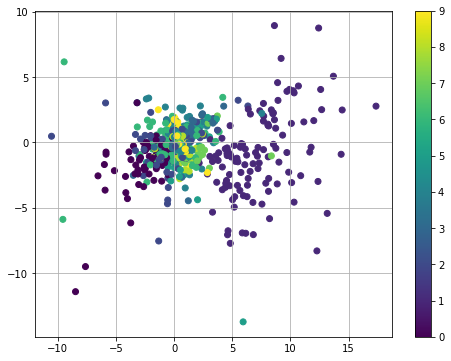

torch.Size([1, 12])


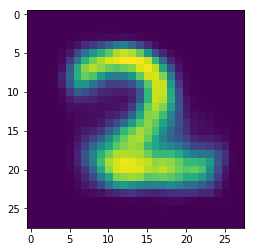

('recon_loss:', 0.15873228013515472)


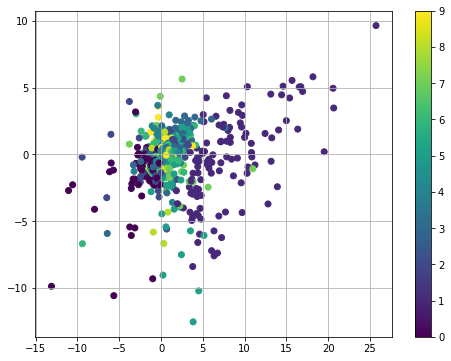

torch.Size([1, 12])


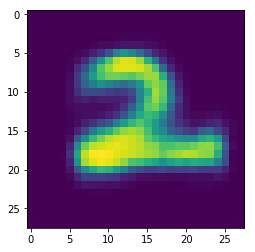

('recon_loss:', 0.1640789657831192)


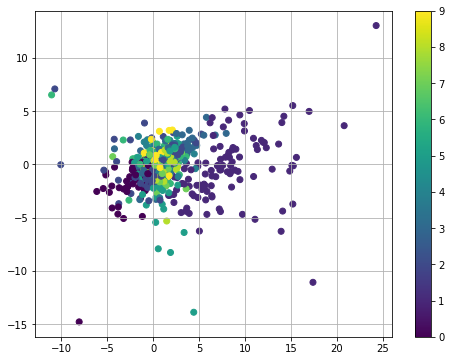

torch.Size([1, 12])


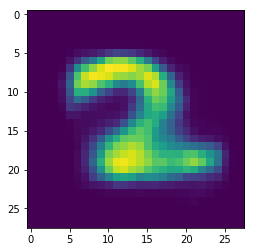

('recon_loss:', 0.15774479508399963)


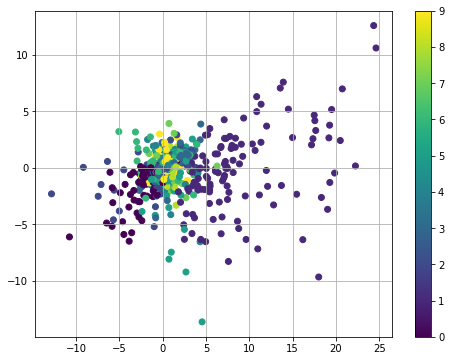

torch.Size([1, 12])


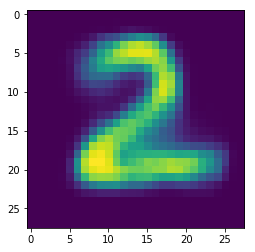

('recon_loss:', 0.16404639184474945)


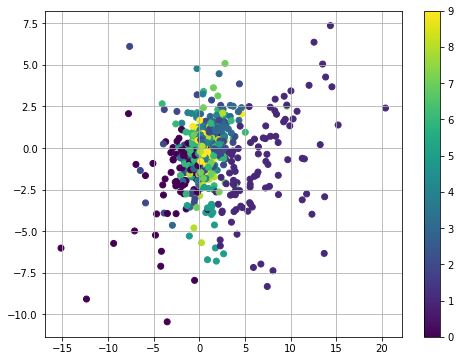

torch.Size([1, 12])


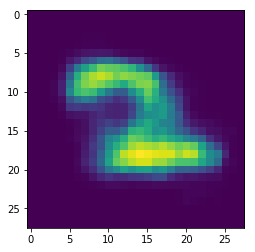

('recon_loss:', 0.15403418242931366)


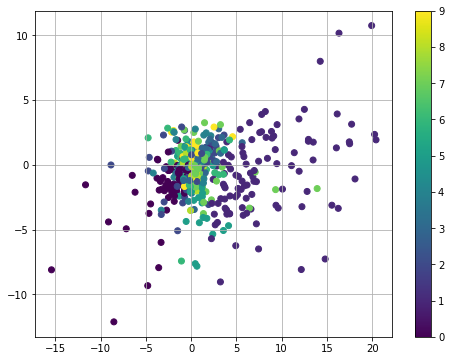

torch.Size([1, 12])


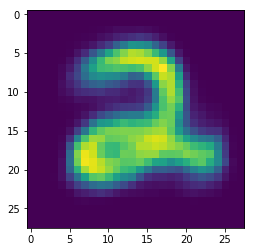

('recon_loss:', 0.16032135486602783)


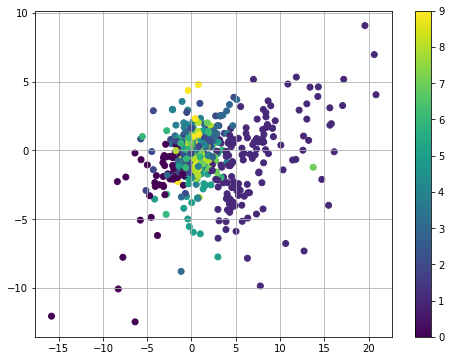

torch.Size([1, 12])


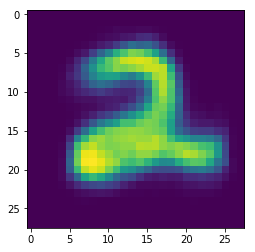

('recon_loss:', 0.15200848877429962)


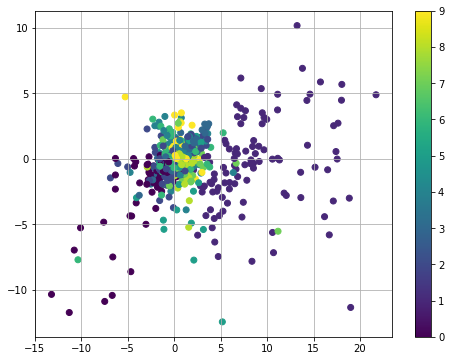

torch.Size([1, 12])


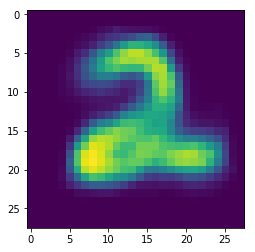

('recon_loss:', 0.16302558779716492)


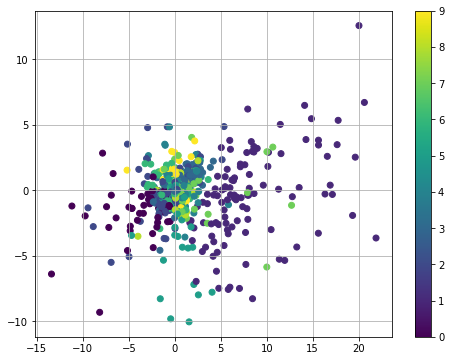

torch.Size([1, 12])


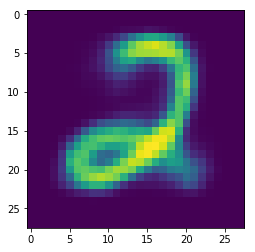

('recon_loss:', 0.15938086807727814)


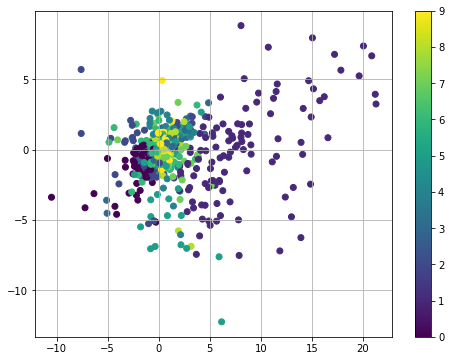

torch.Size([1, 12])


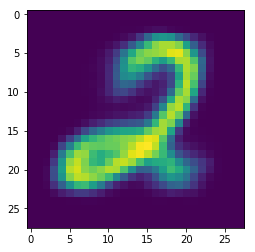

('recon_loss:', 0.15062081813812256)


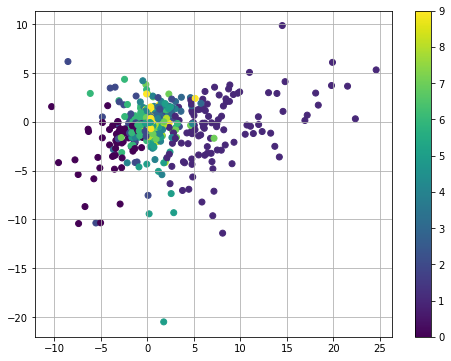

torch.Size([1, 12])


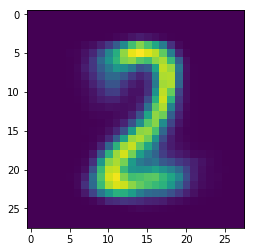

('recon_loss:', 0.14994047582149506)


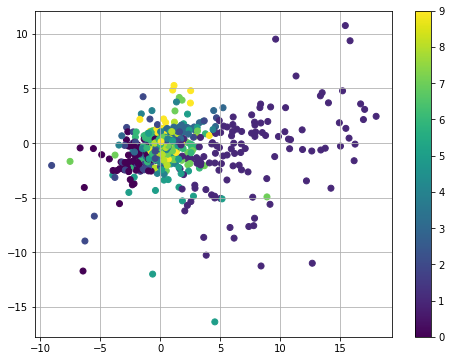

torch.Size([1, 12])


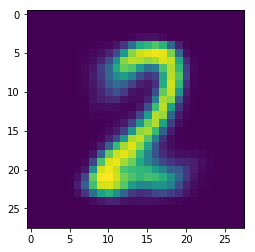

('recon_loss:', 0.1451336145401001)


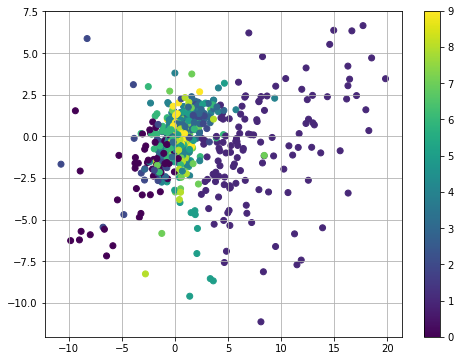

torch.Size([1, 12])


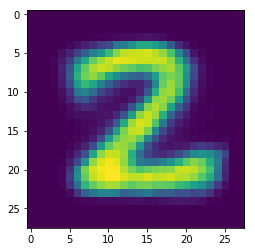

('recon_loss:', 0.15839675068855286)


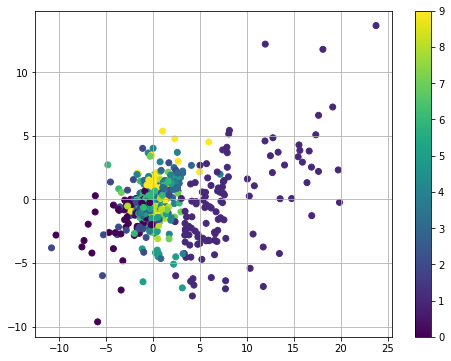

torch.Size([1, 12])


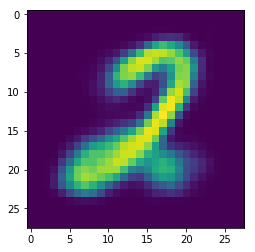

('recon_loss:', 0.16098877787590027)


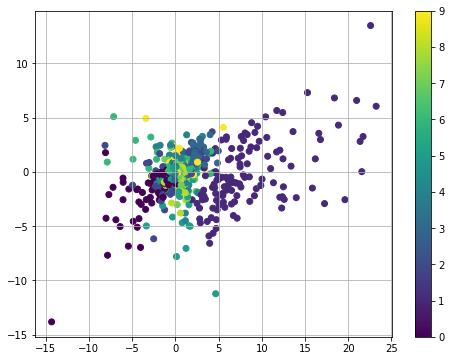

torch.Size([1, 12])


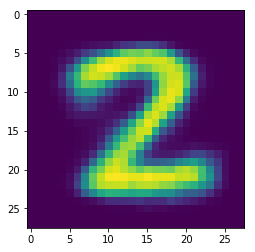

('recon_loss:', 0.16380618512630463)


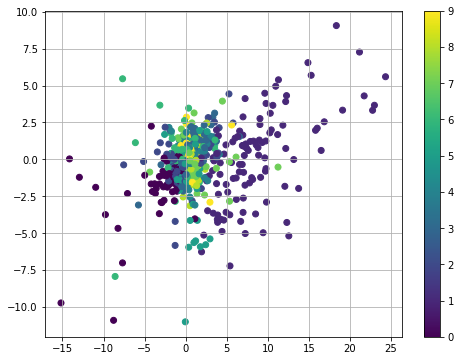

torch.Size([1, 12])


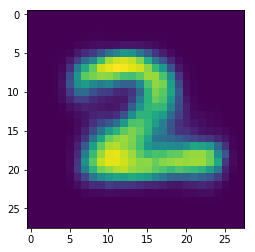

('recon_loss:', 0.15461349487304688)


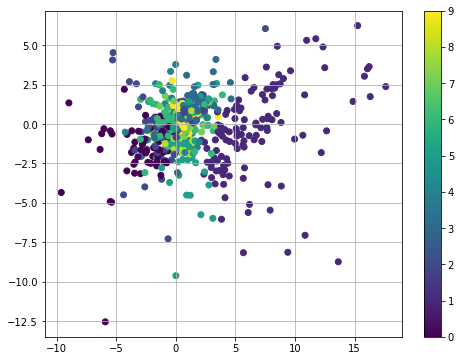

torch.Size([1, 12])


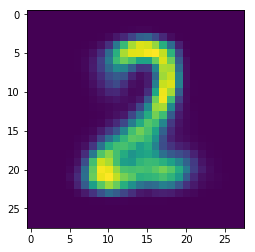

('recon_loss:', 0.16626660525798798)


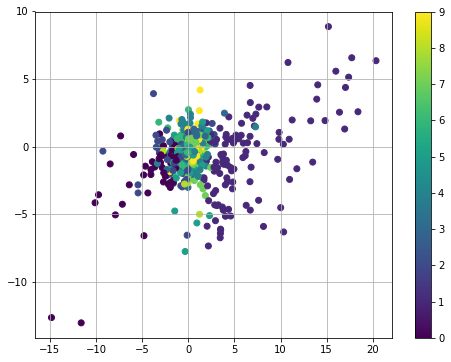

torch.Size([1, 12])


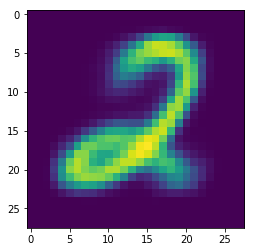

('recon_loss:', 0.15902607142925262)


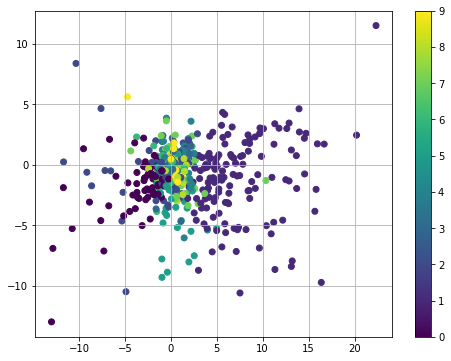

torch.Size([1, 12])


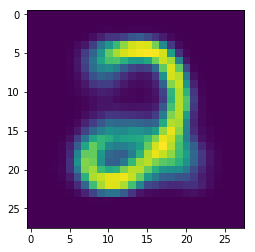

('recon_loss:', 0.15467604994773865)


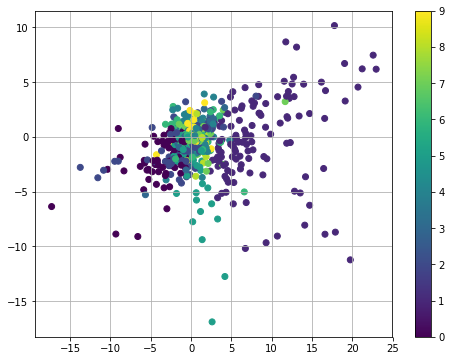

torch.Size([1, 12])


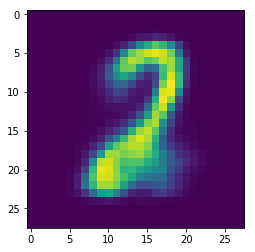

('recon_loss:', 0.1556369513273239)


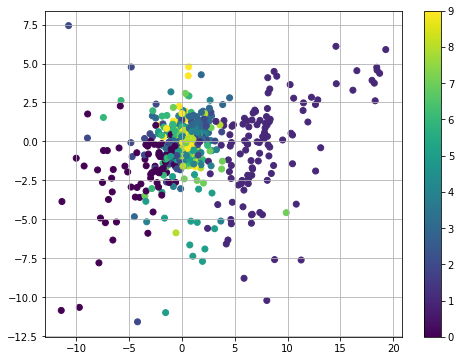

torch.Size([1, 12])


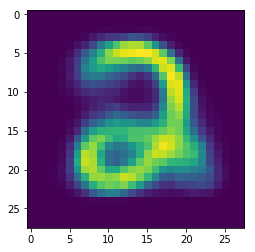

('recon_loss:', 0.1591913253068924)


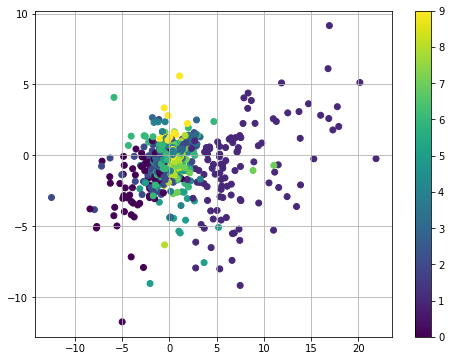

torch.Size([1, 12])


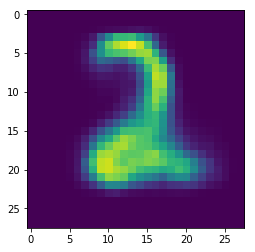

('recon_loss:', 0.15720707178115845)


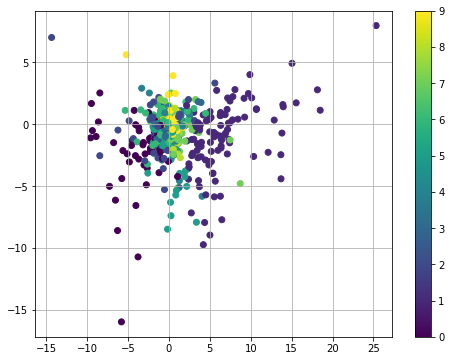

torch.Size([1, 12])


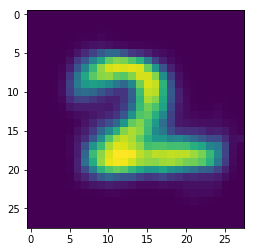

('recon_loss:', 0.14954285323619843)


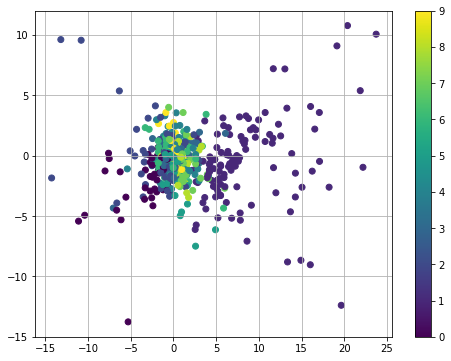

torch.Size([1, 12])


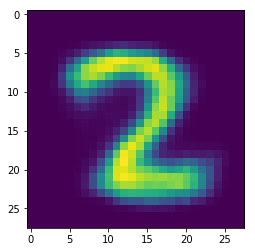

In [10]:
cuda = True
Q,P = generate_model()

torch.Size([1, 12])


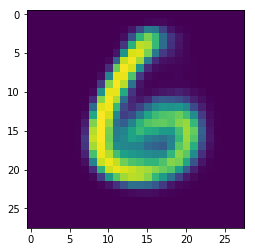

In [11]:
zcheck = Variable(torch.randn(1,z_dim).cuda())
y = np.array([6])
label_info = (add_label_info(y,1,numpy=True))
z_false = np.concatenate((zcheck.cpu().data.numpy(),label_info.cpu().numpy()),1)
z_false = Variable(torch.FloatTensor(z_false)).cuda()
print z_false.size()
x_recon = P(z_false)
op = x_recon.cpu().data.numpy()
op = op.reshape(28,28)
plt.imshow(op)
plt.show()

In [12]:
# if(1==1):
#     xcheck,labels = next(iter(test_loader))
#     labels2 = labels.numpy()
#     xcheck = Variable(xcheck.view(1000,28*28).cuda())
#     zhat = E(xcheck)
#     z_mu = zhat.cpu().data.numpy()
#     print labels2.shape
#     plt.figure(figsize=(8, 6)) 
#     #colors = cm.rainbow(np.linspace(0, 1, 10))
#     plt.scatter(z_mu[:, 0], z_mu[:, 1],c = labels2,cmap=plt.cm.hot)
#     plt.colorbar()
#     plt.grid()
#     plt.show()

In [13]:
# X_embedded = TSNE(n_components=2).fit_transform(z_mu)
# plt.figure(figsize=(8, 6)) 
# plt.scatter(X_embedded[:, 0], X_embedded[:, 1],c = labels2,cmap=plt.cm.hot)
# plt.colorbar()
# plt.grid()
# plt.show()

In [14]:
# noise = np.random.randn(1,z_dim)
# label = 7
#     #print noise.shape,label.shape
# z = 0.5*noise + label*10
# z = Variable(torch.FloatTensor(z).cuda())
# op = G(z).cpu().data.numpy()
# op = op.reshape(28,28)
# plt.imshow(op)
# plt.show()